## Efficientnet Adversarial Learning with CTKD - WIDER (Class Reduced)

In [1]:
import time
import torch
import json
import random
import math
import warnings
import torchvision
import os
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

from pathlib import Path
from tqdm import tqdm
from PIL import Image
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import pairwise_distances_argmin_min, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, precision_recall_fscore_support
from sklearn.model_selection import train_test_split, StratifiedKFold
from torch.utils.data import Subset, Dataset, DataLoader
from torchvision.models import EfficientNet
from torchvision.datasets import ImageFolder
from utils.loss_functions import tkd_kdloss

# Suppress all warnings
warnings.filterwarnings("ignore")

In [2]:
def get_next_available_dir(root_dir):
    """
    If a directory at 'root_dir' exists, append a number to create a new path.
    For example, if 'RUN' exists, this returns 'RUN_01', and so on.
    """
    if not os.path.exists(root_dir):
        return root_dir

    i = 1
    new_dir = f"{root_dir}_{str(i).zfill(2)}"

    while os.path.exists(new_dir):
        i += 1
        new_dir = f"{root_dir}_{str(i).zfill(2)}"

    return new_dir

In [3]:
# Hyperparameters
learning_rate = 0.0005 # 0.096779
epochs = 100
epochs_pretrain = 3
epochs_optimal_lr = 3
patience_teacher = 3
patience_student = 5
temperature = 4.0
alpha = 0.9
momentum = 0.9
step_size = 30
gamma = 0.1
batch_size = 64
num_workers = 4

# CTKD Loss
initial_temperature = 20.0

# set to true to use stratified sampling
stratified_sampling_flag = False

# list of lambda values to loop through for grid search
lmda_list_teacher = [0,4]
lmda_list_student = [0,4]

# labels used including for plotting
class_labels = [0, 1, 3, 4, 6, 7, 11, 15, 17, 18, 19, 20, 22, 25, 27, 28, 30, 31, 33, 35, 36, 37, 39, 43, 44, 50, 51, 54, 57, 58]
class_labels_new = torch.tensor([i for i in range(len(class_labels))])
num_classes = 16
class_names_new = [f"Class {label}" for label in range(num_classes)]

# SPECIFY OUT DIR NAME
# Create directory and file path to save all outputs
directory_name = 'New_Directory'
# This will append version to end of directory name and create new directory if already exists
output_dir = get_next_available_dir(directory_name)

os.makedirs(output_dir, exist_ok=True)

In [4]:
# set device to cuda if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Check if CUDA is available
cuda_available = torch.cuda.is_available()

# Count the number of GPUs available
num_gpus = torch.cuda.device_count()

print("CUDA Available:", cuda_available)
print("Number of GPUs:", num_gpus)

torch.cuda.empty_cache()

CUDA Available: True
Number of GPUs: 1


In [5]:
# Assuming your JSON file is named 'your_file.json'
file_path = 'data/WIDER/Annotations/wider_attribute_trainval.json'

with open(file_path, 'r') as file:
    # Load the JSON data from the file
    data = json.load(file)

class_idx = data['scene_id_map']

In [6]:
new_label_mapping = {
    0: "Team_Sports",
    1: "Celebration",
    2: "Parade",
    3: "Waiter_Or_Waitress",
    4: "Individual_Sports",
    5: "Surgeons",
    6: "Spa",
    7: "Law_Enforcement",
    8: "Business",
    9: "Dresses",
    10: "Water_Activities",
    11: "Picnic",
    12: "Rescue",
    13: "Cheering",
    14: "Performance_And_Entertainment",
    15: "Family"
}

# Ensure that all 16 new classes are covered
# If some classes are not explicitly mentioned in new_label_mapping, add them
for i in range(num_classes):
    if i not in new_label_mapping:
        new_label_mapping[i] = "Additional Category {}".format(i)

class_idx = new_label_mapping

In [7]:
class StratifiedBatchSampler:
    """Stratified batch sampling
    Provides equal representation of target classes in each batch
    """
    def __init__(self, y, batch_size, shuffle=True):
        if torch.is_tensor(y):
            y = y.numpy()
        assert len(y.shape) == 1, 'label array must be 1D'
        n_batches = int(len(y) / batch_size)
        self.skf = StratifiedKFold(n_splits=n_batches, shuffle=shuffle)
        self.X = torch.randn(len(y),1).numpy()
        self.y = y
        self.shuffle = shuffle
        self.batch_size = batch_size

    def __iter__(self):
        if self.shuffle:
            self.skf.random_state = torch.randint(0,int(1e8),size=()).item()
        for train_idx, test_idx in self.skf.split(self.X, self.y):
            yield test_idx

    def __len__(self):
        return len(self.y)//self.batch_size

In [8]:
class DataSet(Dataset):
    def __init__(self, ann_files, augs, img_size, dataset):

        # Create a mapping from old labels to new labels
        self.label_mapping = {old_label: new_label for new_label, old_label in enumerate(sorted(class_labels))}

        self.new_label_mapping = {
            0: 2,  # Parade
            1: 8,  # Business
            2: 7,  # Law Enforcement
            3: 14,  # Performance and Entertainment
            4: 1,  # Celebration
            5: 13,  # Cheering
            6: 8,  # Business
            7: 8,  # Business
            8: 1,  # Celebration
            9: 14,  # Performance and Entertainment
            10: 15, # Family
            11: 15, # Family
            12: 11, # Picnic
            13: 7, # Law Enforcement
            14: 6, # Spa
            15: 13, # Cheering
            16: 5, # Surgeons
            17: 3, # Waiter or Waitress
            18: 4, # Individual Sports
            19: 0, # Team Sports
            20: 0, # Team Sports
            21: 0, # Team Sports
            22: 4, # Individual Sports
            23: 10, # Water Activities
            24: 4, # Individual Sports
            25: 1, # Celebration
            26: 9, # Dresses
            27: 12, # Rescue
            28: 10,# Water Activities
            29: 0  # Team Sports
        }

        self.dataset = dataset
        self.ann_files = ann_files
        self.augment = self.augs_function(augs, img_size)
        # Initialize transformations directly
        self.transform = transforms.Compose(
            [
                transforms.ToTensor(),
                transforms.Normalize(mean=[0, 0, 0], std=[1, 1, 1])
            ] 
        )
        if self.dataset == "wider":
            self.transform = transforms.Compose(
                [
                    transforms.ToTensor(),
                    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])                ] 
            )        

        self.anns = []
        self.load_anns()
        print(self.augment)

    def augs_function(self, augs, img_size):            
        t = []
        if 'randomflip' in augs:
            t.append(transforms.RandomHorizontalFlip())
        if 'ColorJitter' in augs:
            t.append(transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0))
        if 'resizedcrop' in augs:
            t.append(transforms.RandomResizedCrop(img_size, scale=(0.7, 1.0)))
        if 'RandAugment' in augs:
            t.append(transforms.RandAugment())

        t.append(transforms.Resize((img_size, img_size)))

        return transforms.Compose(t)
    
    def load_anns(self):
        self.anns = []
        for ann_file in self.ann_files:
            json_data = json.load(open(ann_file, "r"))
            self.anns += json_data

    def __len__(self):
        return len(self.anns)

    def __getitem__(self, idx):
        # Make sure the index is within bounds
        idx = idx % len(self)
        ann = self.anns[idx]
        
        try:
            # Attempt to open the image file
            img = Image.open(f'data/WIDER/Image/{ann["file_name"]}').convert("RGB")

            # If this is the wider dataset, proceed with specific processing
            # x, y, w, h = ann['bbox']
            # img_area = img.crop([x, y, x+w, y+h])
            img_area = self.augment(img)
            img_area = self.transform(img_area)
            attributes_list = [target['attribute'] for target in ann['targets']]
            num_people = len(attributes_list)
            attributes_distribution = [max(sum(attribute), 0)/num_people for attribute in zip(*attributes_list)]
            # Extract label from image path
            img_path = f'data/WIDER/Image/{ann["file_name"]}'
            label = self.extract_label(img_path)  # You might need to implement this method
            
            return {
                "label": label,
                "target": torch.tensor([attributes_distribution[0]], dtype=torch.float32),
                "img": img_area
            }
            
        except Exception as e:
            # If any error occurs during the processing of an image, log the error and the index
            print(f"Error processing image at index {idx}: {e}")
            # Instead of returning None, raise the exception
            raise

    def extract_label(self, img_path):
        original_label = None
    
        if "data/WIDER/Image/train" in img_path:
            label_str = img_path.split("data/WIDER/Image/train/")[1].split("/")[0]
            original_label = int(label_str.split("--")[0])
        elif "data/WIDER/Image/test" in img_path:
            label_str = img_path.split("data/WIDER/Image/test/")[1].split("/")[0]
            original_label = int(label_str.split("--")[0])
        elif "data/WIDER/Image/val" in img_path:  # Handle validation images
            label_str = img_path.split("data/WIDER/Image/val/")[1].split("/")[0]
            original_label = int(label_str.split("--")[0])
    
        if original_label is not None:
            remapped_label = self.label_mapping[original_label]
            new_label_mapping = self.new_label_mapping[remapped_label]
            return new_label_mapping
        else:
            raise ValueError(f"Label could not be extracted from path: {img_path}")


In [9]:
train_file = ['data/wider/trainval_wider.json']
test_file = ['data/wider/test_wider.json']


In [10]:
def custom_collate(batch):
    # Filter out any None items in the batch
    batch = [item for item in batch if item is not None]
    # If after filtering the batch is empty, handle this case by either returning an empty tensor or raising an exception
    if len(batch) == 0:
        raise ValueError("Batch is empty after filtering out None items.")
    return torch.utils.data.dataloader.default_collate(batch)


In [11]:
# train_dataset = DataSet(train_file, augs = ['RandAugment'], img_size = 226, dataset = 'wider')
train_dataset = DataSet(train_file, augs = [], img_size = 226, dataset = 'wider')
test_dataset = DataSet(test_file, augs = [], img_size = 226, dataset = 'wider')

if stratified_sampling_flag:
    trainloader = DataLoader(train_dataset, 
                             batch_sampler=StratifiedBatchSampler(torch.tensor([train_dataset[i]['label'] for i in range(len(train_dataset))]), 
                             batch_size=batch_size), num_workers=num_workers, collate_fn=custom_collate)
    testloader = DataLoader(test_dataset, batch_sampler=StratifiedBatchSampler(torch.tensor([test_dataset[i]['label'] for i in range(len(test_dataset))]), 
                             batch_size=batch_size), num_workers=num_workers, collate_fn=custom_collate)
else:
    trainloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, 
                             num_workers=num_workers, collate_fn=custom_collate)
    testloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, collate_fn=custom_collate)


Compose(
    Resize(size=(226, 226), interpolation=bilinear, max_size=None, antialias=warn)
)
Compose(
    Resize(size=(226, 226), interpolation=bilinear, max_size=None, antialias=warn)
)


In [12]:
len(train_dataset)

10324

In [13]:
# def print_batch_class_counts(data_loader, label_mapping, num_batches=5):
#     for i, batch in enumerate(data_loader):
#         if i >= num_batches:
#             break

#         # Extract labels from the batch
#         labels = batch['label']

#         # Count occurrences of each class
#         class_counts = torch.bincount(labels)

#         # Map class counts to class names
#         class_counts_with_names = {label_mapping.get(j, f"Unknown Class {j}"): class_counts[j].item() for j in range(len(class_counts))}

#         # Print class counts and total observations
#         print(f"Batch {i + 1}:")
#         for class_name, count in class_counts_with_names.items():
#             print(f"    {class_name}: {count}")
#         print(f"Total Observations: {len(labels)}\n")

# print_batch_class_counts(trainloader, new_label_mapping)


# Start Training Process

In [14]:
def one_hot_encode(labels, num_classes):
    return np.eye(num_classes)[labels]

def calculate_recall_multiclass(conf_matrix):
    recalls = np.diag(conf_matrix) / np.sum(conf_matrix, axis=1)
    recalls[np.isnan(recalls)] = 0  # Replace NaN with 0
    return recalls

def evaluate_model_with_gender_multiclass(pred, label, gender, num_classes):
    predictions = pred.cpu()
    true_labels = label.cpu()
    gender = gender.cpu()

    # Identify male and female indices based on the gender threshold
    male_indices = np.where(gender >= 0.5)[0]
    female_indices = np.where(gender < 0.5)[0]

    # Convert labels to one-hot encoding
    one_hot_labels = one_hot_encode(true_labels, num_classes=num_classes)
    one_hot_preds = one_hot_encode(predictions, num_classes=num_classes)
    # Initialize recall arrays
    male_recall = np.zeros(num_classes)
    female_recall = np.zeros(num_classes)

    # Extract predictions and labels for male and female indices
    male_predictions = np.argmax(one_hot_preds[male_indices], axis=1)
    female_predictions = np.argmax(one_hot_preds[female_indices], axis=1)
    male_labels = np.argmax(one_hot_labels[male_indices], axis=1)
    female_labels = np.argmax(one_hot_labels[female_indices], axis=1)

    # Check if the class labels are within the expected range
    assert (0 <= male_predictions.min() < num_classes) and (0 <= male_predictions.max() < num_classes), "Invalid class indices in male predictions"
    assert (0 <= female_predictions.min() < num_classes) and (0 <= female_predictions.max() < num_classes), "Invalid class indices in female predictions"
    assert (0 <= male_labels.min() < num_classes) and (0 <= male_labels.max() < num_classes), "Invalid class indices in male labels"
    assert (0 <= female_labels.min() < num_classes) and (0 <= female_labels.max() < num_classes), "Invalid class indices in female labels"

    # Calculate confusion matrices for each gender
    male_conf_matrix = confusion_matrix(male_labels, male_predictions, labels=np.arange(num_classes))
    female_conf_matrix = confusion_matrix(female_labels, female_predictions, labels=np.arange(num_classes))

    # Calculate recall for each class and gender
    male_recall[:len(male_conf_matrix)] = calculate_recall_multiclass(male_conf_matrix)
    female_recall[:len(female_conf_matrix)] = calculate_recall_multiclass(female_conf_matrix)

    return male_recall - female_recall, male_conf_matrix, female_conf_matrix

In [15]:
# Instantiate the models
###################### Testing 1 ######################
# Create instances of your models
teacher_model = torchvision.models.efficientnet_b3(weights='DEFAULT')
teacher_model.classifier = nn.Linear(1536, num_classes)
student_model = torchvision.models.efficientnet_b0(weights='DEFAULT')
student_model.classifier = nn.Linear(1280, num_classes)


This is the initialization of the 2-layer Adversary Perceptron. It is initialized with the number of classes*2, which represents the predicted labels (y_hat) and the true labels (y). The output of the final layer is a regression output, which is intended to predict the strength of gender (continuous number where anything past 0.5 is more male).


In [16]:
class Adversary(nn.Module):
    def __init__(self, input_size=num_classes):
        super(Adversary, self).__init__()

        self.a1 = nn.Linear(input_size, 16)
        self.a2 = nn.Linear(16, 1)  # Output size 1 for regression
        nn.init.xavier_normal_(self.a1.weight)
        nn.init.kaiming_normal_(self.a2.weight, mode='fan_out', nonlinearity='relu')

    def forward(self, input_ids):
        adversary = F.relu(self.a1(input_ids))
        adversary_output = F.sigmoid(self.a2(adversary))  # Linear activation for regression
        return adversary_output

# Instantiate the Adversary
adv = Adversary()


In [17]:
def pretrain_student(student, teacher, trainloader, criterion, optimizer, device, alpha, temperature, epochs_pretrain, patience=patience_student):
    teacher.eval()
    teacher.to(device)
    best_val_loss = float('inf')  
    patience_counter = 0 
    student_epoch_losses = []
    val_losses = []
    
    for epoch in range(epochs_pretrain):
        student.train()
        student.to(device)
        running_loss = 0.0 
        epoch_loss = 0.0  
        num_batches = 0  
        
        for index, data in enumerate(tqdm(trainloader)):

            inputs = data['img'].to(device)
            labels = data['label'].to(device)
            optimizer.zero_grad()
            student_outputs = student(inputs)

            with torch.no_grad():
                teacher_outputs = teacher(inputs)

            ce_loss = criterion(student_outputs, labels)
            kd_loss = tkd_kdloss(student_outputs, teacher_outputs, temperature=temperature)  # Make sure this returns a scalar
            
            # If not scalar, sum up to make sure the loss is scalar
            if kd_loss.ndim != 0:
                kd_loss = kd_loss.sum()
                
            # Now combine the losses
            loss = alpha * kd_loss + (1 - alpha) * ce_loss
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
            epoch_loss += loss.item()
            num_batches += 1
        
        epoch_loss /= num_batches
        print(f'*******Epoch {epoch}: loss - {epoch_loss}')
        student_epoch_losses.append(epoch_loss)

In [18]:
def pretrain_teacher(teacher, trainloader, criterion, optimizer, device, epochs_pretrain, patience=patience_student):
    teacher.to(device)
    teacher.train()  # Set the model to training mode
    best_val_loss = float('inf')  
    patience_counter = 0 
    teacher_epoch_losses = []
    val_losses = []
    
    for epoch in range(epochs_pretrain):
        running_loss = 0.0 
        epoch_loss = 0.0  
        num_batches = 0  
        
        for index, data in enumerate(tqdm(trainloader)):
            inputs = data['img'].to(device)
            labels = data['label'].to(device)
            optimizer.zero_grad()
            teacher_outputs = teacher(inputs)

            ce_loss = criterion(teacher_outputs, labels)
                
            loss = ce_loss
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
            epoch_loss += loss.item()
            num_batches += 1
        
        epoch_loss /= num_batches
        print(f'*******Epoch {epoch}: loss - {epoch_loss}')
        teacher_epoch_losses.append(epoch_loss)

In [19]:
def pretrain_adversary(adv, student, adversary_optimizer, trainloader, adv_criterion, device, epochs_pretrain):

  for epoch in range(epochs_pretrain):
    epoch_loss = 0
    epoch_batches = 0
    for i, data in enumerate(tqdm(trainloader)): # starting from the 0th batch
        # get the inputs and labels
        adv.train()
        adv.to(device)
        inputs = data['img'].to(device)
        labels = data['label'].to(device)
        targets = data['target'].to(device)
        student = student.to(device)
        adversary_optimizer.zero_grad()
        student_output = student(inputs)
        adversary_output = adv(student_output)
        adversary_loss = adv_criterion(adversary_output, targets) # compute loss
        adversary_loss.backward() # back prop
        adversary_optimizer.step()
        epoch_loss += adversary_loss.item()
        epoch_batches += 1

    print("Average Pretrain Adversary epoch loss: ", epoch_loss/epoch_batches)

In [20]:
# Optimizer and scheduler for the student model
student_optimizer = optim.Adam(student_model.parameters(), lr=learning_rate)

# Optimizer and scheduler for the teacher model
teacher_optimizer = optim.SGD(teacher_model.parameters(), lr=learning_rate, momentum=momentum)
teacher_scheduler = torch.optim.lr_scheduler.StepLR(teacher_optimizer, step_size=step_size, gamma=gamma)

optimizer_adv = optim.Adam(adv.parameters(), lr=learning_rate)

# Instantiate the model and the loss function
criterion_clf = nn.CrossEntropyLoss()
adv_criterion = nn.MSELoss()

In [21]:
# #### finding the optimal learning rate
# def train_teacher_optimal_lr(model, trainloader, criterion, optimizer, scheduler, device, epochs_optimal_lr=5, lr_range=(1e-4, 1e-1), plot_loss=True):
#     model.train()
#     model.to(device)
#     lr_values = np.logspace(np.log10(lr_range[0]), np.log10(lr_range[1]), epochs_optimal_lr * len(trainloader))  # Generate learning rates for each batch
#     lr_iter = iter(lr_values)
#     losses = []
#     lrs = []
    
#     for epoch in range(epochs_optimal_lr):
#         for i, batch in enumerate(tqdm(trainloader)):
#             lr = next(lr_iter)
#             for param_group in optimizer.param_groups:
#                 param_group['lr'] = lr  # Set new learning rate
            
#             inputs, labels = batch['img'].to(device), batch['label'].to(device)
#             optimizer.zero_grad()
#             outputs = model(inputs)
#             loss = criterion(outputs, labels)
#             loss.backward()
#             optimizer.step()
            
#             losses.append(loss.item())
#             lrs.append(lr)
    
#     # Calculate the derivative of the loss
#     loss_derivative = np.gradient(losses)
    
#     # Find the learning rate corresponding to the minimum derivative (steepest decline)
#     best_lr_index = np.argmin(loss_derivative)
#     best_lr = lrs[best_lr_index]
    
#     if plot_loss:
#         import matplotlib.pyplot as plt
#         plt.figure()
#         plt.plot(lrs, losses)
#         plt.xscale('log')
#         plt.xlabel('Learning Rate')
#         plt.ylabel('Loss')
#         plt.title('Learning Rate Range Test - Teacher')
#         plt.axvline(x=best_lr, color='red', linestyle='--', label=f'Best LR: {best_lr}')
#         plt.legend()
#         plt.show()
    
#     print(f'Best Learning Rate Teacher: {best_lr}')
#     return best_lr

# ############# input ############## 
# best_lr_teacher = train_teacher_optimal_lr(teacher_model, trainloader, criterion_clf, teacher_optimizer, teacher_scheduler, device, epochs_optimal_lr)  
# print(best_lr_teacher)


In [22]:
# #### finding the optimal learning rate
# def train_student_optimal_lr(model, trainloader, criterion, optimizer, device, epochs_optimal_lr=5, lr_range=(1e-4, 1e-1), plot_loss=True):
#     model.train()
#     model.to(device)
#     lr_values = np.logspace(np.log10(lr_range[0]), np.log10(lr_range[1]), epochs_optimal_lr * len(trainloader))  # Generate learning rates for each batch
#     lr_iter = iter(lr_values)
#     losses = []
#     lrs = []
    
#     for epoch in range(epochs_optimal_lr):
#         for i, batch in enumerate(tqdm(trainloader)):
#             lr = next(lr_iter)
#             for param_group in optimizer.param_groups:
#                 param_group['lr'] = lr  # Set new learning rate
            
#             inputs, labels = batch['img'].to(device), batch['label'].to(device)
#             optimizer.zero_grad()
#             outputs = model(inputs)
#             loss = criterion(outputs, labels)
#             loss.backward()
#             optimizer.step()
            
#             losses.append(loss.item())
#             lrs.append(lr)
    
#     # Calculate the derivative of the loss
#     loss_derivative = np.gradient(losses)
    
#     # Find the learning rate corresponding to the minimum derivative (steepest decline)
#     best_lr_index = np.argmin(loss_derivative)
#     best_lr = lrs[best_lr_index]
    
#     if plot_loss:
#         import matplotlib.pyplot as plt
#         plt.figure()
#         plt.plot(lrs, losses)
#         plt.xscale('log')
#         plt.xlabel('Learning Rate')
#         plt.ylabel('Loss')
#         plt.title('Learning Rate Range Test - Student')
#         plt.axvline(x=best_lr, color='red', linestyle='--', label=f'Best LR: {best_lr}')
#         plt.legend()
#         plt.show()
    
#     print(f'Best Learning Rate Student: {best_lr}')
#     return best_lr

# ############# input ############## 
# best_lr_student = train_student_optimal_lr(student_model, trainloader, criterion_clf, student_optimizer, device, epochs_optimal_lr)  
# print(best_lr_student)

In [23]:
best_lr_student = learning_rate
best_lr_teacher = learning_rate

In [24]:
def plot_loss_curve(losses):
    epochs = range(1, len(losses) + 1)
    plt.plot(epochs, losses)
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Val Loss Curve')
    plt.show()

In [25]:

### CTKD Loss
     
def get_temperature(epoch, initial_temperature, alpha):
    return initial_temperature / (1 + alpha * epoch)


# def knowledge_distillation_loss(outputs, labels, teacher_outputs, temp, alpha):
#     return nn.KLDivLoss(reduction='batchmean')(F.log_softmax(outputs/temp, dim=1),
#                                                F.softmax(teacher_outputs/temp, dim=1)) * (alpha * temp * temp) + \
#            F.cross_entropy(outputs, labels) * (1. - alpha)

def knowledge_distillation_loss(outputs, labels, teacher_outputs, temp, alpha):
    student_log_probs = F.log_softmax(outputs/temp, dim=1)
    teacher_log_probs = F.log_softmax(teacher_outputs/temp, dim=1)
    kd_loss = nn.KLDivLoss(reduction='batchmean', log_target=True)(student_log_probs, teacher_log_probs) * (alpha * temp * temp)
    ce_loss = F.cross_entropy(outputs, labels) * (1. - alpha)
    return kd_loss + ce_loss

In [33]:
def train_teacher(model, adv, trainloader, criterion, adv_criterion, optimizer, optimizer_adv, device, 
                  epochs, lmda, patience=patience_teacher):

    best_val_loss = float('inf')
    patience_counter = 0
    epoch_losses = [] 
    val_losses = []
    val_disparities = []
    val_accuracies = []
    best_total_val_loss = float('inf')

    for epoch in range(epochs):
        model.train()
        adv.train()
        model.to(device)
        adv.to(device)
        running_loss = 0.0
        epoch_loss = 0.0  
        num_batches = 0  
        
        for index, data in enumerate(tqdm(trainloader)):
            inputs = data['img'].to(device)
            labels = data['label'].to(device)
            targets = data['target'].to(device)
        
            # Forward pass for teacher model
            optimizer.zero_grad()
            outputs = model(inputs)
            classification_loss = criterion(outputs, labels)
        
            # Forward pass for adversary model
            optimizer_adv.zero_grad()
            with torch.no_grad():
                teacher_outputs_detached = outputs.detach()
            adversary_output = adv(teacher_outputs_detached)
            adversary_loss = adv_criterion(adversary_output, targets)
        
            # Calculate the total loss by combining classification and adversary loss
            if lmda != 0:
                total_loss = classification_loss + classification_loss/adversary_loss - lmda * adversary_loss
            else:
                total_loss = classification_loss
                
            total_loss.backward()
        
            optimizer.step()
            optimizer_adv.step()
        
            running_loss += total_loss.item()
            epoch_loss += total_loss.item()
            num_batches += 1

        epoch_loss /= num_batches  
        epoch_losses.append(epoch_loss)

        model.eval()
        total_correct = 0
        total_samples = 0
        total_val_loss = 0.0
        num_batches = 0
        confusion_male = np.zeros((num_classes, num_classes))
        confusion_female = np.zeros((num_classes, num_classes))
        
        with torch.no_grad():
            for val_data in tqdm(testloader):
                val_inputs = val_data['img'].to(device)
                val_labels = val_data['label'].to(device)
                val_targets = val_data['target'].to(device)
                
                val_outputs = model(val_inputs)
                with torch.no_grad():
                    teacher_outputs_detached_val = val_outputs.detach()                
                adversary_output_val = adv(teacher_outputs_detached_val)
                adversary_loss_val = adv_criterion(adversary_output_val, val_targets)
                
                # Compute validation loss
                val_ce_loss = criterion(val_outputs, val_labels)

                if lmda !=0:
                    val_loss = val_ce_loss + val_ce_loss/adversary_loss_val - lmda * adversary_loss_val
                else:
                    val_loss = val_ce_loss
                    
                total_val_loss += val_loss.item()

                # Compute the validation accuracy
                _, predicted = torch.max(val_outputs, 1)
                total_samples += val_labels.size(0)
                total_correct += (predicted == val_labels).sum().item()
                num_batches += 1

                # Compute recall differences for gender
                recall_diff = evaluate_model_with_gender_multiclass(predicted, val_labels, val_targets, num_classes=num_classes)
                confusion_male += recall_diff[1]
                confusion_female += recall_diff[2]

            total_val_loss /= num_batches
            confusion_male /= num_batches
            confusion_female /= num_batches
            
            epoch_disparity = calculate_recall_multiclass(confusion_male) - calculate_recall_multiclass(confusion_female)
            val_losses.append(total_val_loss)
            non_zero_abs_values = np.abs(epoch_disparity[epoch_disparity != 0])
            mean_non_zero_abs_disparity = np.mean(non_zero_abs_values)
            val_disparities.append(mean_non_zero_abs_disparity)
            accuracy = total_correct / total_samples
            val_accuracies.append(accuracy)
            class_recall_mapping = {class_name: epoch_disparity[int(class_label)] for class_label, class_name in class_idx.items()}

            print(f'*****Epoch {epoch + 1}/{epochs}*****\n' 
            f'*****Train Loss: {epoch_loss: .6f} Val Loss: {total_val_loss: .6f}*****\n'
            f'*****Validation Accuracy: {accuracy * 100:.2f}%*****\n'
            f'*****Total Avg Disparity: {mean_non_zero_abs_disparity}*****\n')
            
            # Print disparities by class label
            for class_label, recall_diff in class_recall_mapping.items():
                print(f"Class {class_label}: Recall Difference = {recall_diff}")

        # Check for early stopping
        if abs(total_val_loss) < abs(best_total_val_loss):
            best_total_val_loss = total_val_loss
            patience_counter = 0 
            best_epoch_mean_abs_disparity = mean_non_zero_abs_disparity

            # Save the teacher model and its state to the 'output_dir'
            teacher_model_weights_path = os.path.join(output_dir, f'teacher_model_ctkd_wider_lambda{i}.pth')
            torch.save(teacher_model.state_dict(), teacher_model_weights_path)
            
            teacher_model_path = os.path.join(output_dir, f'teacher_model_ctkd_wider_checkpoint{i}.pth')
            torch.save(teacher_model, teacher_model_path)
        else:
            patience_counter += 1 

        if patience_counter >= patience:
            print('Early stopping')
            break  

        # Writing epoch data to file
        file_path = os.path.join(output_dir, f'teacher_validation_{lmda}.txt')
        with open(file_path, 'a') as file:
            file.write(f'*****Epoch {epoch + 1}/{epochs}*****\n')
            file.write(f'*****Train Loss: {epoch_loss:.6f} Val Loss: {total_val_loss:.6f}*****\n')
            file.write(f'*****Validation Accuracy: {accuracy * 100:.2f}%*****\n')
            file.write(f'*****Total Avg Disparity: {mean_non_zero_abs_disparity}*****\n')
    
            # Writing disparities by class label
            for class_label, recall_diff in class_recall_mapping.items():
                file.write(f"Class {class_label}: Recall Difference = {recall_diff}\n")

        print(f"Data has been appended to {file_path}")
        
    plot_loss_curve(val_losses)
    print(f"Finished Training Teacher for lambda val of {lmda}")
    return val_disparities



def train_student_with_distillation_disparity(student, teacher, adv, trainloader, testloader, criterion, adv_criterion, optimizers, optimizera, 
                                              device, alpha, temperature, initial_temperature, epochs, lmda, patience=patience_student):
    teacher.eval()
    teacher.to(device)
    best_val_accuracy = 0
    best_total_val_loss = float('inf')
    best_epoch_accuracy = 0.0
    best_epoch_disparity = 0.0
    patience_counter = 0 
    student_epoch_losses = []
    val_losses = []
    val_disparities = []
    val_accuracies = []

    for epoch in range(epochs):
        student.train()
        student.to(device)
        if lmda != 0:
            adv.train()
            adv.to(device)
        running_loss = 0.0 
        epoch_loss = 0.0  
        num_batches = 0 
        confusion_male = np.zeros((num_classes, num_classes))
        confusion_female = np.zeros((num_classes, num_classes))

        for index, data in enumerate(tqdm(trainloader)):
            inputs = data['img'].to(device)
            labels = data['label'].to(device)
            targets = data['target'].to(device)
            optimizers.zero_grad()
            student_outputs = student(inputs)
            with torch.no_grad():
                teacher_outputs = teacher(inputs)

            # Run the adversarial model on concatenated true labels, and predicted labels
            if lmda != 0:
                optimizera.zero_grad()
                studentached = student_outputs.detach()
                with torch.no_grad():
                    adversary_output = adv(studentached)
                adversary_loss = adv_criterion(adversary_output, targets)
                
            # ce_loss = criterion(student_outputs, labels)
            # kd_loss = tkd_kdloss(student_outputs, teacher_outputs, temperature=temperature)  # Make sure this returns a scalar
            
            # temperature = get_temperature(epoch, initial_temperature, alpha)
            temperature = get_temperature(epoch, initial_temperature, alpha)
            ctkd_loss = knowledge_distillation_loss(student_outputs, labels, teacher_outputs.detach(), temperature, alpha)


            # ctkd_loss = \
            #     nn.KLDivLoss(reduction='batchmean')(F.log_softmax(student_outputs/temperature, dim=1),
            #                                                    F.softmax(teacher_outputs/temperature, dim=1)) * \
            #                                                     (alpha * temperature * temperature) + \
            #                                                     F.cross_entropy(student_outputs, labels) * (1. - alpha)
                    
            # if kd_loss.ndim != 0:
            #     kd_loss = kd_loss.sum()

            # Now combine the losses, subtract weighted adversary loss because we need to maximize that loss 
            # goal of the model is to have the adversary not predict gender. 
            if lmda != 0:
                loss = ctkd_loss + ctkd_loss/adversary_loss - lmda * adversary_loss
            else:
                loss = ctkd_loss
                
            loss.backward()

            optimizers.step()
            if lmda != 0:
                optimizera.step()
            running_loss += loss.item()
            epoch_loss += loss.item()
            num_batches += 1

        epoch_loss /= num_batches
        student_epoch_losses.append(epoch_loss)

        student.eval()
        adv.eval()
        adv.to(device)
        total_correct = 0
        total_samples = 0
        total_val_loss = 0.0
        num_batches = 0
        # Validation after each epoch
        with torch.no_grad():
            for val_data in tqdm(testloader):
                val_inputs = val_data['img'].to(device)
                val_labels = val_data['label'].to(device)
                val_targets = val_data['target'].to(device)
                
                # Forward pass for validation
                val_student_outputs = student(val_inputs)
                val_teacher_outputs = teacher(val_inputs)
            
                if lmda != 0:
                    val_studentached = val_student_outputs.detach()   
                    val_adversary_output = adv(val_studentached)
                    val_adversary_loss = adv_criterion(val_adversary_output, val_targets)
                    
                # val_ce_loss = criterion(val_student_outputs, val_labels)
                # val_kd_loss = tkd_kdloss(val_student_outputs, val_teacher_outputs, temperature=temperature)  # Make sure this returns a scalar
                
                # Correcting the labels used in the loss calculation
                val_temperature = get_temperature(epoch, initial_temperature, alpha)
                val_ctkd_loss = knowledge_distillation_loss(val_student_outputs, val_labels, val_teacher_outputs.detach(), val_temperature, alpha)

                # if val_kd_loss.ndim != 0:
                #     val_kd_loss = val_kd_loss.sum()
                if lmda != 0:
                    val_loss = val_ctkd_loss + val_ctkd_loss/val_adversary_loss - lmda * val_adversary_loss
                else:
                    val_loss = val_ctkd_loss
                    
                total_val_loss += val_loss.item()
    
                # Compute the validation accuracy
                _, predicted = torch.max(val_student_outputs, 1)
                total_samples += val_labels.size(0)
                total_correct += (predicted == val_labels).sum().item()
                num_batches += 1
                recall_diff = evaluate_model_with_gender_multiclass(predicted, val_labels, val_targets, num_classes=num_classes)
                confusion_male += recall_diff[1]
                confusion_female += recall_diff[2]
    
            total_val_loss /= num_batches
            confusion_male /= num_batches
            confusion_female /= num_batches

            epoch_disparity = calculate_recall_multiclass(confusion_male) - calculate_recall_multiclass(confusion_female)
            val_losses.append(total_val_loss)
            non_zero_abs_values = np.abs(epoch_disparity[epoch_disparity != 0])
            mean_non_zero_abs_disparity = np.mean(non_zero_abs_values)
            val_disparities.append(mean_non_zero_abs_disparity)
            accuracy = total_correct / total_samples
            val_accuracies.append(accuracy)
            class_recall_mapping = {class_name: epoch_disparity[int(class_label)] for class_label, class_name in class_idx.items()}
            print(f'*****Epoch {epoch + 1}/{epochs}*****\n' 
            f'*****Train Loss: {epoch_loss: .6f} Val Loss: {total_val_loss: .6f}*****\n'
            f'*****Validation Accuracy: {accuracy * 100:.2f}%*****\n'
            f'*****Total Avg Disparity: {mean_non_zero_abs_disparity}*****\n')
        
            # Print disparities by class label
            for class_label, recall_diff in class_recall_mapping.items():
                print(f"Class {class_label}: Recall Difference = {recall_diff}")

        # Check for early stopping
        if abs(total_val_loss) < abs(best_total_val_loss):
            best_total_val_loss = total_val_loss
            patience_counter = 0
            best_epoch_mean_abs_disparity = mean_non_zero_abs_disparity
            state_dict_path = os.path.join(output_dir, f'student_model_weights_ctkd_wider_checkpoint_lambda{lmda}.pth')
            torch.save(student.state_dict(), state_dict_path)
            model_path = os.path.join(output_dir, f'student_model_ctkd_wider_checkpoint_lambda{lmda}.pth')
            torch.save(student, model_path)
        else:
            patience_counter += 1 

        if patience_counter >= patience:
            print('Early stopping')
            break  

        # Writing epoch data to file
        file_path = os.path.join(output_dir, f'student_validation_{lmda}.txt')
        with open(file_path, 'a') as file:
            file.write(f'*****Epoch {epoch + 1}/{epochs}*****\n')
            file.write(f'*****Train Loss: {epoch_loss:.6f} Val Loss: {total_val_loss:.6f}*****\n')
            file.write(f'*****Validation Accuracy: {accuracy * 100:.2f}%*****\n')
            file.write(f'*****Total Avg Disparity: {mean_non_zero_abs_disparity}*****\n')
    
            # Writing disparities by class label
            for class_label, recall_diff in class_recall_mapping.items():
                file.write(f"Class {class_label}: Recall Difference = {recall_diff}\n")
        print(f"Data has been appended to {file_path}")

    plot_loss_curve(val_losses)
    print(f'Finished Training Student for lambda value of {lmda}')
    return val_disparities


In [62]:
# Initialize the dictionary for results
lambda_results = {}

# Loop for training the teacher model with different lambda values
for i in lmda_list_teacher:
    # Reset the teacher model for each lambda
    teacher_model = torchvision.models.efficientnet_b3(weights='DEFAULT')    
    # Replace the last fully connected layer with a new one
    teacher_model.classifier = nn.Linear(1536, num_classes)
    teacher_optimizer = optim.Adam(teacher_model.parameters(), lr=best_lr_teacher)
    
    # Initialize the adversary for the teacher
    adv = Adversary()
    teacher_optimizer_adv = optim.Adam(adv.parameters(), lr=best_lr_teacher)

    # pretrain_teacher(teacher_model, trainloader, criterion_clf, teacher_optimizer, device, epochs_pretrain)
    # pretrain_adversary(adv, student_model, optimizer_adv, trainloader, adv_criterion, device, epochs_pretrain)
    
    # Train the teacher model with adversarial training
    teacher_mean_abs_val_disparity = train_teacher(teacher_model, adv, trainloader, criterion_clf, adv_criterion, teacher_optimizer, teacher_optimizer_adv, device, 20, i, patience=patience_teacher)

    # Save the teacher model and its state to the 'output_dir'
    teacher_model_weights_path = os.path.join(output_dir, f'teacher_model_weights_ctkd_wider_lambda{i}.pth')
    torch.save(teacher_model.state_dict(), teacher_model_weights_path)
    teacher_model_path = os.path.join(output_dir, f'teacher_model_ctkd_wider_lambda{i}.pth')
    torch.save(teacher_model, teacher_model_path)
    print('Teacher weights and architecture saved and exported for lambda:', i)

    # Store the teacher results in the dictionary
    lambda_results[i] = {
        'teacher_mean_abs_val_disparity': teacher_mean_abs_val_disparity
    }


In [34]:
lambda_results = \
    {0: {'teacher_mean_abs_val_disparity': 
         [0.151527213701308,
          0.1177676498454304,
          0.13282242164100277,
          0.16311412538004233]},
     4: {'teacher_mean_abs_val_disparity':
         [0.13392541005011852,
          0.18668419672757142,
          0.15385919005065007,
          0.17064052136594748,
          0.1446536752882509]}}
lambda_results

{0: {'teacher_mean_abs_val_disparity': [0.151527213701308,
   0.1177676498454304,
   0.13282242164100277,
   0.16311412538004233]},
 4: {'teacher_mean_abs_val_disparity': [0.13392541005011852,
   0.18668419672757142,
   0.15385919005065007,
   0.17064052136594748,
   0.1446536752882509]}}

In [35]:
output_dir = 'New_Directory_03'

100%|██████████████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.76it/s]


*****Epoch 1/100*****
*****Train Loss:  3.877258 Val Loss:  1.577117*****
*****Validation Accuracy: 59.80%*****
*****Total Avg Disparity: 0.18397451471532697*****

Class Team_Sports: Recall Difference = 0.09232125898792576
Class Celebration: Recall Difference = 0.033410138248847976
Class Parade: Recall Difference = -0.03745318352059934
Class Waiter_Or_Waitress: Recall Difference = -0.1295133437990581
Class Individual_Sports: Recall Difference = -0.12848970251716252
Class Surgeons: Recall Difference = -0.07142857142857145
Class Spa: Recall Difference = -0.6530612244897959
Class Law_Enforcement: Recall Difference = 0.10995670995671003
Class Business: Recall Difference = 0.15454931972789115
Class Dresses: Recall Difference = -0.7437499999999999
Class Water_Activities: Recall Difference = 0.03235361130097969
Class Picnic: Recall Difference = -0.32727272727272727
Class Rescue: Recall Difference = -0.05619380619380618
Class Cheering: Recall Difference = 0.0510664479081214
Class Performance_A

100%|██████████████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.81it/s]


*****Epoch 2/100*****
*****Train Loss:  2.840916 Val Loss:  1.691163*****
*****Validation Accuracy: 63.35%*****
*****Total Avg Disparity: 0.17223145075085072*****

Class Team_Sports: Recall Difference = 0.10263193596526932
Class Celebration: Recall Difference = -0.0783410138248849
Class Parade: Recall Difference = -0.014060293485602116
Class Waiter_Or_Waitress: Recall Difference = -0.06279434850863419
Class Individual_Sports: Recall Difference = -0.1432875667429444
Class Surgeons: Recall Difference = -0.047619047619047616
Class Spa: Recall Difference = -0.7346938775510204
Class Law_Enforcement: Recall Difference = 0.06876932591218299
Class Business: Recall Difference = 0.042304421768707356
Class Dresses: Recall Difference = -0.7000000000000001
Class Water_Activities: Recall Difference = 0.07746639325586713
Class Picnic: Recall Difference = -0.34545454545454546
Class Rescue: Recall Difference = 0.10214785214785216
Class Cheering: Recall Difference = 0.028096800656275678
Class Performanc

100%|██████████████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.82it/s]


*****Epoch 3/100*****
*****Train Loss:  2.313655 Val Loss:  2.032400*****
*****Validation Accuracy: 63.64%*****
*****Total Avg Disparity: 0.15396645312436588*****

Class Team_Sports: Recall Difference = 0.06966490299823647
Class Celebration: Recall Difference = 0.004608294930875667
Class Parade: Recall Difference = 0.009946583164486933
Class Waiter_Or_Waitress: Recall Difference = -0.09890109890109888
Class Individual_Sports: Recall Difference = -0.12292143401983202
Class Surgeons: Recall Difference = -0.10267857142857145
Class Spa: Recall Difference = -0.7346938775510204
Class Law_Enforcement: Recall Difference = 0.08472479901051344
Class Business: Recall Difference = 0.01998299319727892
Class Dresses: Recall Difference = -0.69375
Class Water_Activities: Recall Difference = 0.06265664160401019
Class Picnic: Recall Difference = -0.12727272727272726
Class Rescue: Recall Difference = 0.07042957042957049
Class Cheering: Recall Difference = 0.045324036095159975
Class Performance_And_Entert

100%|██████████████████████████████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.72it/s]


*****Epoch 4/100*****
*****Train Loss:  1.844968 Val Loss:  2.007201*****
*****Validation Accuracy: 64.76%*****
*****Total Avg Disparity: 0.1903036970540613*****

Class Team_Sports: Recall Difference = 0.06898656898656907
Class Celebration: Recall Difference = -0.023425499231950808
Class Parade: Recall Difference = -0.002824338429422202
Class Waiter_Or_Waitress: Recall Difference = -0.1703296703296705
Class Individual_Sports: Recall Difference = -0.11521739130434794
Class Surgeons: Recall Difference = -0.09375
Class Spa: Recall Difference = -0.7551020408163266
Class Law_Enforcement: Recall Difference = 0.19826839826839826
Class Business: Recall Difference = 0.0607993197278911
Class Dresses: Recall Difference = -0.6543269230769231
Class Water_Activities: Recall Difference = 0.12246525404420139
Class Picnic: Recall Difference = -0.4
Class Rescue: Recall Difference = 0.10839160839160833
Class Cheering: Recall Difference = 0.0461443806398687
Class Performance_And_Entertainment: Recall Diff

100%|██████████████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.75it/s]


*****Epoch 5/100*****
*****Train Loss:  1.427851 Val Loss:  1.928697*****
*****Validation Accuracy: 63.87%*****
*****Total Avg Disparity: 0.1602522996789441*****

Class Team_Sports: Recall Difference = 0.009315787093564842
Class Celebration: Recall Difference = -0.01651305683563753
Class Parade: Recall Difference = 0.0038681156750782764
Class Waiter_Or_Waitress: Recall Difference = -0.10596546310832033
Class Individual_Sports: Recall Difference = -0.018421052631579005
Class Surgeons: Recall Difference = -0.10863095238095255
Class Spa: Recall Difference = -0.8163265306122448
Class Law_Enforcement: Recall Difference = 0.13011750154607293
Class Business: Recall Difference = -0.020408163265306145
Class Dresses: Recall Difference = -0.6875000000000001
Class Water_Activities: Recall Difference = 0.03987240829346106
Class Picnic: Recall Difference = -0.14545454545454545
Class Rescue: Recall Difference = 0.1535964035964037
Class Cheering: Recall Difference = 0.007793273174733328
Class Performa

100%|██████████████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.78it/s]


*****Epoch 6/100*****
*****Train Loss:  1.105027 Val Loss:  1.943319*****
*****Validation Accuracy: 65.31%*****
*****Total Avg Disparity: 0.17247656648889625*****

Class Team_Sports: Recall Difference = 0.03873287206620535
Class Celebration: Recall Difference = 0.029185867895545226
Class Parade: Recall Difference = -0.008288819303739259
Class Waiter_Or_Waitress: Recall Difference = -0.152276295133438
Class Individual_Sports: Recall Difference = -0.10469107551487422
Class Surgeons: Recall Difference = -0.18005952380952395
Class Spa: Recall Difference = -0.7755102040816327
Class Law_Enforcement: Recall Difference = 0.07099567099567083
Class Business: Recall Difference = 0.009141156462585065
Class Dresses: Recall Difference = -0.65625
Class Water_Activities: Recall Difference = 0.14559125085440894
Class Picnic: Recall Difference = -0.2
Class Rescue: Recall Difference = 0.10839160839160833
Class Cheering: Recall Difference = 0.0237899917965545
Class Performance_And_Entertainment: Recall Di

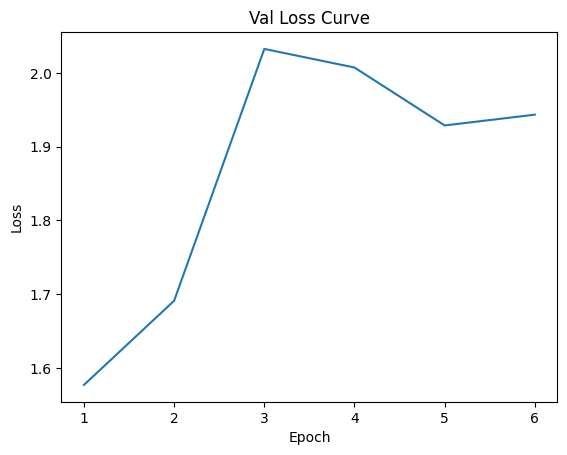

Finished Training Student for lambda value of 0
Student weights and architecture saved and exported for lambda: 0


100%|████████████████████████████████████████████████████████████████████████| 162/162 [01:21<00:00,  1.99it/s]


*******Epoch 0: loss - 0.576069958967927


100%|████████████████████████████████████████████████████████████████████████| 162/162 [01:21<00:00,  1.98it/s]


*******Epoch 1: loss - 0.34641576411179553


100%|████████████████████████████████████████████████████████████████████████| 162/162 [01:21<00:00,  1.98it/s]


*******Epoch 2: loss - 0.22615050579662677


100%|████████████████████████████████████████████████████████████████████████| 162/162 [01:41<00:00,  1.60it/s]


Average Pretrain Adversary epoch loss:  0.37522842946611806


100%|████████████████████████████████████████████████████████████████████████| 162/162 [01:41<00:00,  1.60it/s]


Average Pretrain Adversary epoch loss:  0.374558264458621


100%|████████████████████████████████████████████████████████████████████████| 162/162 [01:41<00:00,  1.60it/s]


Average Pretrain Adversary epoch loss:  0.3754005213210612


100%|██████████████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.78it/s]


*****Epoch 1/100*****
*****Train Loss:  8.705811 Val Loss:  5.989935*****
*****Validation Accuracy: 63.43%*****
*****Total Avg Disparity: 0.17982118152482407*****

Class Team_Sports: Recall Difference = 0.06894134671912455
Class Celebration: Recall Difference = -0.044546850998463894
Class Parade: Recall Difference = -0.03229569595382831
Class Waiter_Or_Waitress: Recall Difference = -0.13736263736263743
Class Individual_Sports: Recall Difference = -0.13619374523264682
Class Surgeons: Recall Difference = -0.06994047619047616
Class Spa: Recall Difference = -0.836734693877551
Class Law_Enforcement: Recall Difference = 0.10970933828076701
Class Business: Recall Difference = 0.020408163265306034
Class Dresses: Recall Difference = -0.7125
Class Water_Activities: Recall Difference = 0.10765550239234467
Class Picnic: Recall Difference = -0.2
Class Rescue: Recall Difference = -0.026723276723276734
Class Cheering: Recall Difference = 0.03609515996718626
Class Performance_And_Entertainment: Recall

100%|██████████████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.76it/s]


*****Epoch 2/100*****
*****Train Loss:  5.455952 Val Loss:  6.747656*****
*****Validation Accuracy: 64.53%*****
*****Total Avg Disparity: 0.1769470544613741*****

Class Team_Sports: Recall Difference = 0.07649346538235435
Class Celebration: Recall Difference = -0.11482334869431643
Class Parade: Recall Difference = 0.012341130963344882
Class Waiter_Or_Waitress: Recall Difference = -0.10910518053375207
Class Individual_Sports: Recall Difference = -0.10289855072463772
Class Surgeons: Recall Difference = -0.08482142857142871
Class Spa: Recall Difference = -0.6938775510204082
Class Law_Enforcement: Recall Difference = 0.046011131725417376
Class Business: Recall Difference = 0.04081632653061229
Class Dresses: Recall Difference = -0.723076923076923
Class Water_Activities: Recall Difference = 0.04727728411938947
Class Picnic: Recall Difference = -0.38181818181818183
Class Rescue: Recall Difference = -0.0459540459540459
Class Cheering: Recall Difference = -0.01394585726004921
Class Performance_

100%|██████████████████████████████████████████████████████████████████████████| 55/55 [00:20<00:00,  2.65it/s]


*****Epoch 3/100*****
*****Train Loss:  4.115224 Val Loss:  7.353162*****
*****Validation Accuracy: 64.27%*****
*****Total Avg Disparity: 0.1863844377847439*****

Class Team_Sports: Recall Difference = 0.026387193053859614
Class Celebration: Recall Difference = -0.03955453149001553
Class Parade: Recall Difference = -0.08571253146681401
Class Waiter_Or_Waitress: Recall Difference = -0.17032967032967028
Class Individual_Sports: Recall Difference = -0.09202898550724636
Class Surgeons: Recall Difference = 0.025297619047618958
Class Spa: Recall Difference = -0.7551020408163265
Class Law_Enforcement: Recall Difference = 0.08695114409400129
Class Business: Recall Difference = -0.019982993197278753
Class Dresses: Recall Difference = -0.73125
Class Water_Activities: Recall Difference = 0.05513784461152882
Class Picnic: Recall Difference = -0.38181818181818183
Class Rescue: Recall Difference = 0.08966033966033976
Class Cheering: Recall Difference = 0.014971287940935163
Class Performance_And_Ente

100%|██████████████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.81it/s]


*****Epoch 4/100*****
*****Train Loss:  3.149477 Val Loss:  7.379140*****
*****Validation Accuracy: 64.50%*****
*****Total Avg Disparity: 0.1785453894564226*****

Class Team_Sports: Recall Difference = 0.025708859042192334
Class Celebration: Recall Difference = -0.09024577572964676
Class Parade: Recall Difference = -0.0960275066003562
Class Waiter_Or_Waitress: Recall Difference = -0.22919937205651508
Class Individual_Sports: Recall Difference = -0.06994660564454602
Class Surgeons: Recall Difference = 0.008928571428571508
Class Spa: Recall Difference = -0.6938775510204082
Class Law_Enforcement: Recall Difference = 0.032405689548546834
Class Business: Recall Difference = -0.011692176870748305
Class Dresses: Recall Difference = -0.6749999999999999
Class Water_Activities: Recall Difference = 0.08532695374800647
Class Picnic: Recall Difference = -0.509090909090909
Class Rescue: Recall Difference = 0.11563436563436569
Class Cheering: Recall Difference = -0.021944216570959796
Class Performanc

100%|██████████████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.77it/s]


*****Epoch 5/100*****
*****Train Loss:  2.365631 Val Loss:  7.240873*****
*****Validation Accuracy: 64.33%*****
*****Total Avg Disparity: 0.16454535474995685*****

Class Team_Sports: Recall Difference = 0.02844480622258383
Class Celebration: Recall Difference = -0.001536098310291778
Class Parade: Recall Difference = 0.0020261558298028115
Class Waiter_Or_Waitress: Recall Difference = -0.14207221350078492
Class Individual_Sports: Recall Difference = -0.12848970251716252
Class Surgeons: Recall Difference = -0.06994047619047616
Class Spa: Recall Difference = -0.7959183673469388
Class Law_Enforcement: Recall Difference = 0.04378478664192942
Class Business: Recall Difference = 0.019770408163265363
Class Dresses: Recall Difference = -0.6605769230769232
Class Water_Activities: Recall Difference = 0.05468215994531789
Class Picnic: Recall Difference = -0.36363636363636365
Class Rescue: Recall Difference = 0.043456543456543484
Class Cheering: Recall Difference = 0.05926989335520927
Class Performa

100%|██████████████████████████████████████████████████████████████████████████| 55/55 [00:19<00:00,  2.84it/s]


*****Epoch 6/100*****
*****Train Loss:  1.593188 Val Loss:  7.400576*****
*****Validation Accuracy: 64.91%*****
*****Total Avg Disparity: 0.17992568527583203*****

Class Team_Sports: Recall Difference = 0.029801474245918835
Class Celebration: Recall Difference = -0.004608294930875556
Class Parade: Recall Difference = -0.07324860318045068
Class Waiter_Or_Waitress: Recall Difference = -0.2370486656200943
Class Individual_Sports: Recall Difference = -0.10152555301296717
Class Surgeons: Recall Difference = 0.049107142857142794
Class Spa: Recall Difference = -0.7551020408163266
Class Law_Enforcement: Recall Difference = 0.0029684601113172393
Class Business: Recall Difference = 0.009141156462585065
Class Dresses: Recall Difference = -0.7043269230769231
Class Water_Activities: Recall Difference = 0.032467532467532534
Class Picnic: Recall Difference = -0.38181818181818195
Class Rescue: Recall Difference = 0.09540459540459545
Class Cheering: Recall Difference = 0.0063576702214929726
Class Perfo

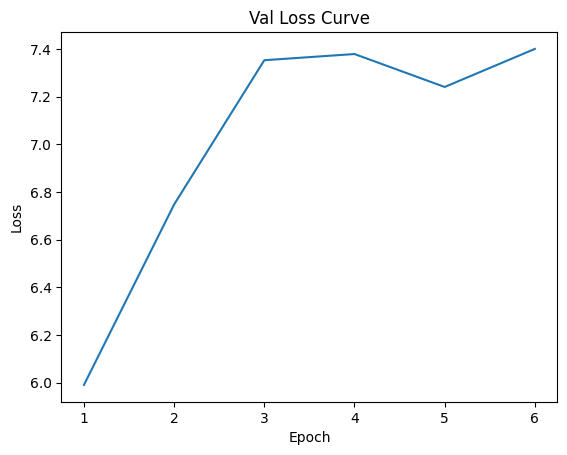

Finished Training Student for lambda value of 4
Student weights and architecture saved and exported for lambda: 4


In [36]:
# Loop for training the student model with different lambda values
for i in lmda_list_student:
    # load teacher model with lambda 0
    teacher_model_path = os.path.join(output_dir, 'teacher_model_ctkd_wider_lambda0.pth')
    teacher_model = torch.load(teacher_model_path)
    teacher_model_weights_path = os.path.join(output_dir, 'teacher_model_weights_ctkd_wider_lambda0.pth')
    teacher_model.load_state_dict(torch.load(teacher_model_weights_path))
    teacher_model = teacher_model.to(device)
    
    # Reset the student model for each lambda
    student_model = torchvision.models.efficientnet_b0(weights='DEFAULT')
    student_model.classifier = nn.Linear(1280, num_classes)
    student_optimizer = optim.Adam(student_model.parameters(), lr=best_lr_student)
    
    adv = Adversary()
    student_optimizer_adv = optim.Adam(adv.parameters(), lr=learning_rate)
    
    if i != 0:
        pretrain_student(student_model, teacher_model, trainloader, criterion_clf, student_optimizer, device, alpha, temperature, epochs_pretrain)
        pretrain_adversary(adv, teacher_model, optimizer_adv, trainloader, adv_criterion, device, epochs_pretrain)
    
    student_mean_abs_val_disparity = train_student_with_distillation_disparity(student_model, teacher_model, adv, trainloader, testloader, criterion_clf, 
                                                                               adv_criterion, student_optimizer, student_optimizer_adv, device, alpha, 
                                                                               temperature, initial_temperature, epochs, lmda=i, patience=patience_student)

    # Save the student model's state dictionary to the 'output_dir'
    student_model_weights_path = os.path.join(output_dir, f'student_model_weights_ctkd_wider_lambda{i}.pth')
    torch.save(student_model.state_dict(), student_model_weights_path)
    student_model_path = os.path.join(output_dir, f'student_model_ctkd_wider_lambda{i}.pth')
    torch.save(student_model, student_model_path)

    print('Student weights and architecture saved and exported for lambda:', i)

    # Check if the key exists in the dictionary
    if i not in lambda_results:
        # If not, create a new entry for that key
        lambda_results[i] = {
            'student_mean_abs_val_disparity': student_mean_abs_val_disparity
        }
    else:
        # If the key exists, update the existing entry
        lambda_results[i].update({
            'student_mean_abs_val_disparity': student_mean_abs_val_disparity
        })


In [37]:
lambda_results

{0: {'teacher_mean_abs_val_disparity': [0.151527213701308,
   0.1177676498454304,
   0.13282242164100277,
   0.16311412538004233],
  'student_mean_abs_val_disparity': [0.18397451471532697,
   0.17223145075085072,
   0.15396645312436588,
   0.1903036970540613,
   0.1602522996789441,
   0.17247656648889625]},
 4: {'teacher_mean_abs_val_disparity': [0.13392541005011852,
   0.18668419672757142,
   0.15385919005065007,
   0.17064052136594748,
   0.1446536752882509],
  'student_mean_abs_val_disparity': [0.17982118152482407,
   0.1769470544613741,
   0.1863844377847439,
   0.1785453894564226,
   0.16454535474995685,
   0.17992568527583203]}}

In [45]:
def compare_performance_metrics(teacher, student, dataloader):
    teacher.eval()
    student.eval()
    
    all_labels = []
    all_teacher_preds = []
    all_student_preds = []

    for batch in dataloader:
        inputs = batch['img'].to(device)
        labels = batch['label'].to(device)
        
        with torch.no_grad():
            teacher_outputs = teacher(inputs)
            student_outputs = student(inputs)
            
        teacher_preds = torch.argmax(teacher_outputs, dim=1).cpu().numpy()
        student_preds = torch.argmax(student_outputs, dim=1).cpu().numpy()
        
        all_labels.append(labels.cpu().numpy())
        all_teacher_preds.append(teacher_preds)
        all_student_preds.append(student_preds)

    all_labels = np.concatenate(all_labels)
    all_teacher_preds = np.concatenate(all_teacher_preds)
    all_student_preds = np.concatenate(all_student_preds)
    
    metrics = {
        'accuracy': (accuracy_score(all_labels, all_teacher_preds), accuracy_score(all_labels, all_student_preds)),
        'precision': (precision_score(all_labels, all_teacher_preds, average='weighted', zero_division=0), precision_score(all_labels, all_student_preds, average='weighted', zero_division=0)),
        'recall': (recall_score(all_labels, all_teacher_preds, average='weighted'), recall_score(all_labels, all_student_preds, average='weighted')),
        'f1': (f1_score(all_labels, all_teacher_preds, average='weighted'), f1_score(all_labels, all_student_preds, average='weighted'))
    }

    return {
        'metrics': metrics,
        'all_labels': all_labels,
        'all_teacher_preds': all_teacher_preds,
        'all_student_preds': all_student_preds
    }

def compare_model_size(teacher, student):
    teacher_params = sum(p.numel() for p in teacher.parameters())
    student_params = sum(p.numel() for p in student.parameters())
    return teacher_params, student_params

def compare_inference_time(teacher, student, dataloader):
    dataiter = iter(dataloader)
    data = next(dataiter)
    inputs = data['img']
    inputs = inputs.to(device)

    teacher_time, student_time = 0, 0

    if teacher is not None:
        teacher = teacher.to(device)
        start_time = time.time()
        with torch.no_grad():
            teacher_outputs = teacher(inputs)
        teacher_time = time.time() - start_time

    if student is not None:
        student = student.to(device)
        start_time = time.time()
        with torch.no_grad():
            student_outputs = student(inputs)
        student_time = time.time() - start_time
    
    return teacher_time, student_time


In [46]:
# Loop through each lambda value
for lmda_teacher in lmda_list_teacher:
    for lmda_student in lmda_list_student:

        # Load the teacher model for the current lambda from the 'output_dir'
        teacher_model_path = os.path.join(output_dir, f'teacher_model_ctkd_wider_lambda{lmda_teacher}.pth')
        teacher_model = torch.load(teacher_model_path)
        
        # Load the student model for the current lambda from the 'output_dir'
        student_model_path = os.path.join(output_dir, f'student_model_ctkd_wider_lambda{lmda_student}.pth')
        student_model = torch.load(student_model_path)
    
        # Compute performance metrics
        performance_metrics = compare_performance_metrics(teacher_model, student_model, testloader)
    
        # Compute model sizes
        teacher_params, student_params = compare_model_size(teacher_model, student_model)
    
        # Construct a unique key for the current combination of lambda values
        lambda_key = (lmda_teacher, lmda_student)

        # Update results for the current lambda value
        if lambda_key in lambda_results:
            lambda_results[lambda_key].update({
                'performance_metrics': performance_metrics,
                'teacher_params': teacher_params,
                'student_params': student_params
            })
        else:
            lambda_results[lambda_key] = {
                'performance_metrics': performance_metrics,
                'teacher_params': teacher_params,
                'student_params': student_params
            }


Teacher:  (0.6398268398268399, 0.6398268398268399, 0.658008658008658, 0.658008658008658)
Student (0.6531024531024531, 0.649062049062049, 0.6531024531024531, 0.649062049062049)


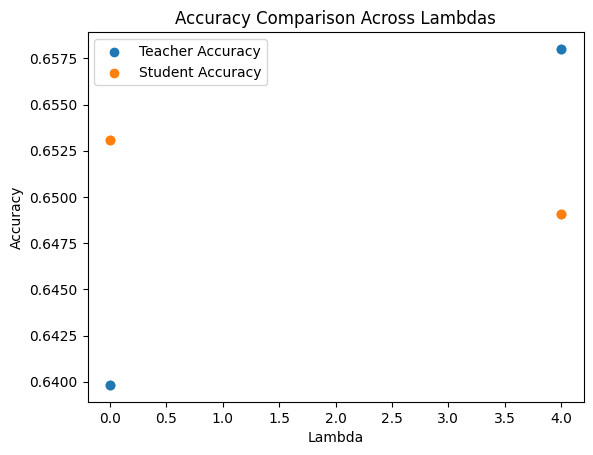

In [62]:
# Initialize lists to store accuracies
teacher_accuracies = []
student_accuracies = []
lambda_pairs = list(lambda_results.keys())

# Iterate over the keys in lambda_results
for key in lambda_pairs:
    # Check if the key is a tuple (indicating a lambda pair)
    if isinstance(key, tuple) and len(key) == 2:
        lmda_teacher, lmda_student = key
    else:
        # If the key is not a tuple, skip this iteration
        continue

    # Access the performance metrics for each pair
    teacher_accuracy = lambda_results[(lmda_teacher, lmda_student)]['performance_metrics']['metrics']['accuracy'][0]
    student_accuracy = lambda_results[(lmda_teacher, lmda_student)]['performance_metrics']['metrics']['accuracy'][1]

    # Append accuracies to the lists
    teacher_accuracies.append((lmda_teacher, teacher_accuracy))
    student_accuracies.append((lmda_student, student_accuracy))

    # To plot, you might need to separate the lambda values and accuracies
    teacher_lambdas, teacher_acc = zip(*teacher_accuracies)
    student_lambdas, student_acc = zip(*student_accuracies)

print("Teacher: ", teacher_acc)
print("Student" , student_acc)

# Plotting only with markers and no lines
plt.scatter(teacher_lambdas, teacher_acc, label='Teacher Accuracy', marker='o')
plt.scatter(student_lambdas, student_acc, label='Student Accuracy', marker='o')

# Adding labels and title
plt.xlabel('Lambda')
plt.ylabel('Accuracy')
plt.title('Accuracy Comparison Across Lambdas')
plt.legend()

# Show plot
plt.show()


Teacher:  (0.6595899531907662, 0.6595899531907662, 0.6646027645426091, 0.6646027645426091)
Student (0.6623612308659059, 0.6508388655832793, 0.6623612308659059, 0.6508388655832793)


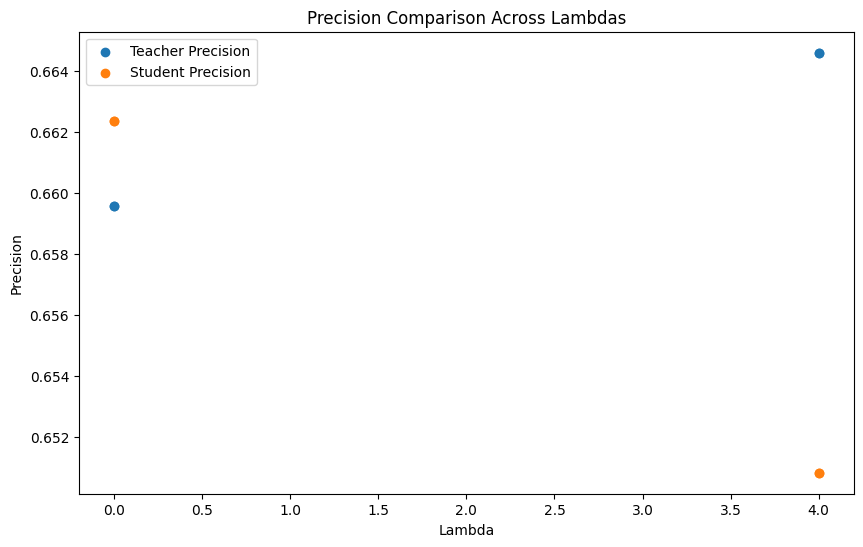

In [63]:
# Initialize lists to store precisions
teacher_precisions = []
student_precisions = []
lambda_pairs = list(lambda_results.keys())

# Iterate over the keys in lambda_results
for key in lambda_pairs:
    # Check if the key is a tuple (indicating a lambda pair)
    if isinstance(key, tuple) and len(key) == 2:
        lmda_teacher, lmda_student = key
        # Access the precision metrics for each pair
        teacher_precision = lambda_results[(lmda_teacher, lmda_student)]['performance_metrics']['metrics']['precision'][0]
        student_precision = lambda_results[(lmda_teacher, lmda_student)]['performance_metrics']['metrics']['precision'][1]
    else:
        # If the key is not a tuple, skip this iteration
        continue

    # Append precisions to the lists along with lambda values
    teacher_precisions.append((lmda_teacher, teacher_precision))
    student_precisions.append((lmda_student, student_precision))

    # Extracting lambda values and precisions
    teacher_lambdas, teacher_prec = zip(*teacher_precisions)
    student_lambdas, student_prec = zip(*student_precisions)

print("Teacher: ", teacher_prec)
print("Student" , student_prec) 

# Creating a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(teacher_lambdas, teacher_prec, label='Teacher Precision', marker='o')
plt.scatter(student_lambdas, student_prec, label='Student Precision', marker='o')

# Adding labels and title
plt.xlabel('Lambda')
plt.ylabel('Precision')
plt.title('Precision Comparison Across Lambdas')
plt.legend()

# Displaying the plot
plt.show()

Teacher:  (0.6398268398268399, 0.6398268398268399, 0.658008658008658, 0.658008658008658)
Student (0.6531024531024531, 0.649062049062049, 0.6531024531024531, 0.649062049062049)


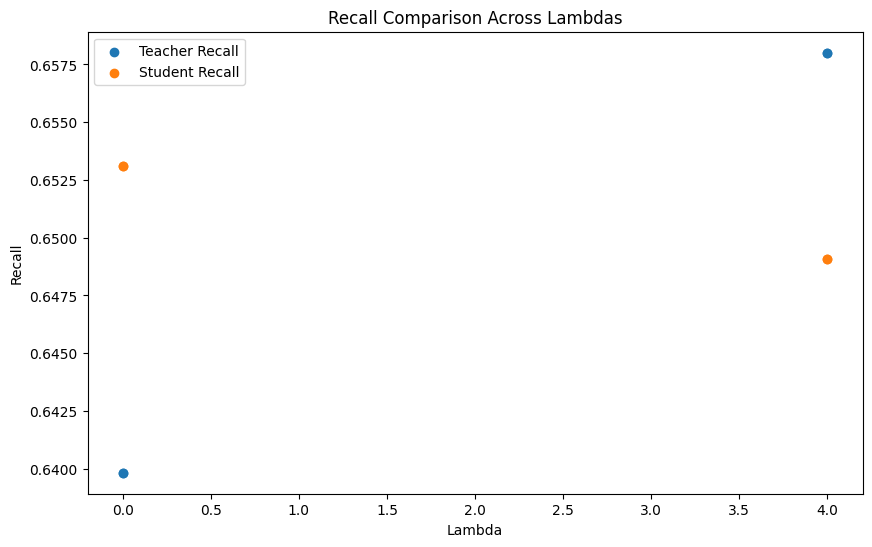

In [73]:
# Initialize lists to store recalls
teacher_recalls = []
student_recalls = []
lambda_pairs = list(lambda_results.keys())

# Iterate over the keys in lambda_results
for key in lambda_pairs:
    # Check if the key is a tuple (indicating a lambda pair)
    if isinstance(key, tuple) and len(key) == 2:
        lmda_teacher, lmda_student = key
        # Access the recall metrics for each pair
        teacher_recall = lambda_results[(lmda_teacher, lmda_student)]['performance_metrics']['metrics']['recall'][0]
        student_recall = lambda_results[(lmda_teacher, lmda_student)]['performance_metrics']['metrics']['recall'][1]
    else:
        # If the key is not a tuple, skip this iteration
        continue

    # Append recalls to the lists along with lambda values
    teacher_recalls.append((lmda_teacher, teacher_recall))
    student_recalls.append((lmda_student, student_recall))

    # Extracting lambda values and recalls
    teacher_lambdas, teacher_rec = zip(*teacher_recalls)
    student_lambdas, student_rec = zip(*student_recalls)


print("Teacher: ", teacher_rec)
print("Student" , student_rec) 


# Creating a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(teacher_lambdas, teacher_rec, label='Teacher Recall', marker='o')
plt.scatter(student_lambdas, student_rec, label='Student Recall', marker='o')

# Adding labels and title
plt.xlabel('Lambda')
plt.ylabel('Recall')
plt.title('Recall Comparison Across Lambdas')
plt.legend()

# Displaying the plot
plt.show()


Teacher:  (0.6429028995080356, 0.6429028995080356, 0.6588611082340917, 0.6588611082340917)
Student (0.6540186928338765, 0.6465597590255537, 0.6540186928338765, 0.6465597590255537)


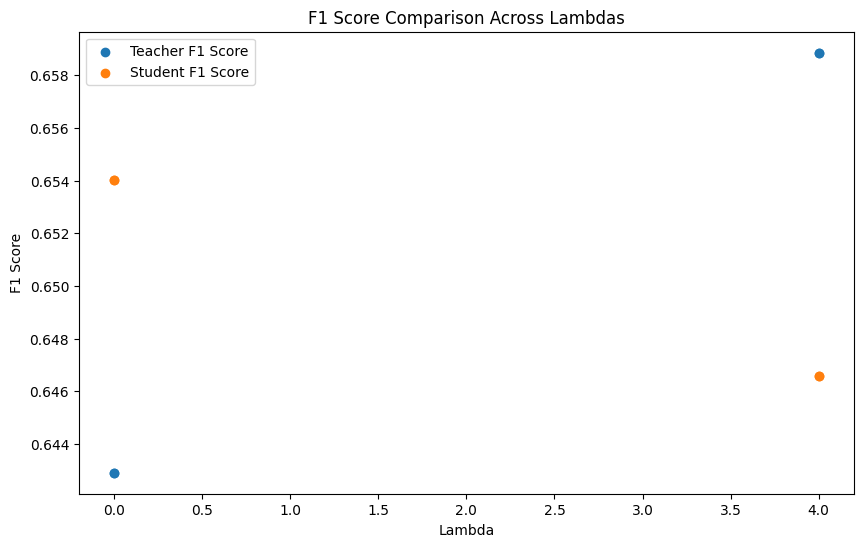

In [72]:
# Initialize lists to store F1 scores
teacher_f1s = []
student_f1s = []
lambda_pairs = list(lambda_results.keys())

# Iterate over the keys in lambda_results
for key in lambda_pairs:
    # Check if the key is a tuple (indicating a lambda pair)
    if isinstance(key, tuple) and len(key) == 2:
        lmda_teacher, lmda_student = key
        # Access the F1 scores for each pair
        teacher_f1 = lambda_results[(lmda_teacher, lmda_student)]['performance_metrics']['metrics']['f1'][0]
        student_f1 = lambda_results[(lmda_teacher, lmda_student)]['performance_metrics']['metrics']['f1'][1]
    else:
        # If the key is not a tuple, skip this iteration
        continue

    # Append F1 scores to the lists along with lambda values
    teacher_f1s.append((lmda_teacher, teacher_f1))
    student_f1s.append((lmda_student, student_f1))

    # Extracting lambda values and F1 scores
    teacher_lambdas, teacher_f1_scores = zip(*teacher_f1s)
    student_lambdas, student_f1_scores = zip(*student_f1s)

print("Teacher: ", teacher_f1_scores)
print("Student" , student_f1_scores) 

# Creating a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(teacher_lambdas, teacher_f1_scores, label='Teacher F1 Score', marker='o')
plt.scatter(student_lambdas, student_f1_scores, label='Student F1 Score', marker='o')

# Adding labels and title
plt.xlabel('Lambda')
plt.ylabel('F1 Score')
plt.title('F1 Score Comparison Across Lambdas')
plt.legend()

# Displaying the plot
plt.show()

Teacher:  (10.720824, 10.720824, 10.720824, 10.720824)
Student (4.028044, 4.028044, 4.028044, 4.028044)


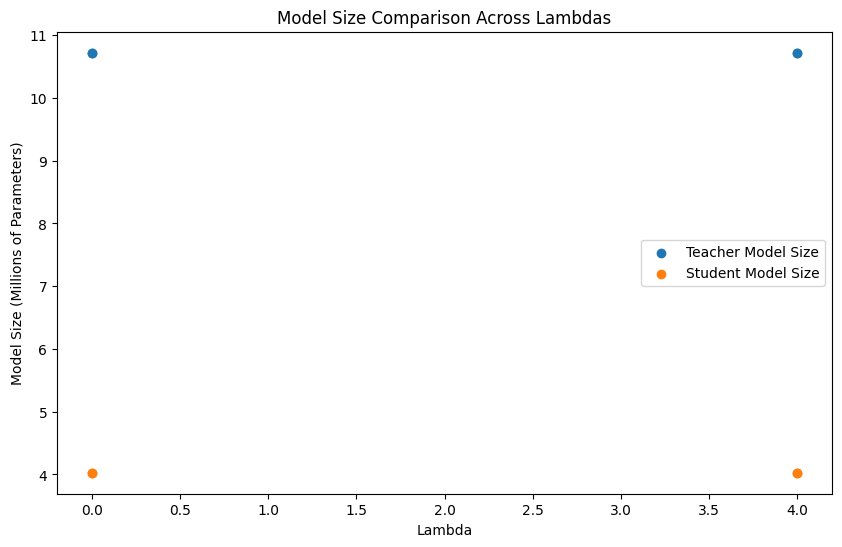

In [71]:
# Initialize lists to store model sizes
teacher_sizes = []
student_sizes = []
lambda_pairs = list(lambda_results.keys())

# Iterate over the keys in lambda_results
for key in lambda_pairs:
    # Check if the key is a tuple (indicating a lambda pair)
    if isinstance(key, tuple) and len(key) == 2:
        lmda_teacher, lmda_student = key
        # Access the model sizes for each pair
        teacher_size = lambda_results[(lmda_teacher, lmda_student)]['teacher_params'] / 1e6  # Convert to millions
        student_size = lambda_results[(lmda_teacher, lmda_student)]['student_params'] / 1e6
    else:
        # If the key is not a tuple, skip this iteration
        continue

    # Append model sizes to the lists along with lambda values
    teacher_sizes.append((lmda_teacher, teacher_size))
    student_sizes.append((lmda_student, student_size))

    # Extracting lambda values and model sizes
    teacher_lambdas, teacher_model_sizes = zip(*teacher_sizes)
    student_lambdas, student_model_sizes = zip(*student_sizes)

print("Teacher: ", teacher_model_sizes)
print("Student" , student_model_sizes) 


# Creating a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(teacher_lambdas, teacher_model_sizes, label='Teacher Model Size', marker='o')
plt.scatter(student_lambdas, student_model_sizes, label='Student Model Size', marker='o')

# Adding labels and title
plt.xlabel('Lambda')
plt.ylabel('Model Size (Millions of Parameters)')
plt.title('Model Size Comparison Across Lambdas')
plt.legend()

# Displaying the plot
plt.show()


Teacher:  (0.05062699317932129, 0.04882979393005371)
Student (0.04128098487854004, 0.029421567916870117)


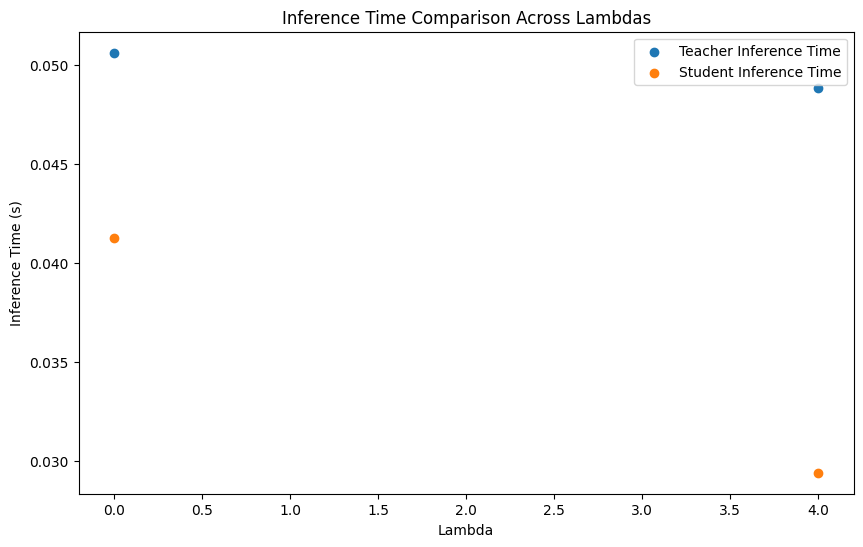

In [70]:
# Initialize dictionaries to store inference times for each lambda value
teacher_times = {}
student_times = {}

# Loop through each lambda value
for lmda_teacher in lmda_list_teacher:
    # Load the teacher model for the current lambda
    teacher_model_path = os.path.join(output_dir, f'teacher_model_ctkd_wider_lambda{lmda_teacher}.pth')
    teacher_model = torch.load(teacher_model_path)

    teacher_time, _ = compare_inference_time(teacher_model, None, testloader)
    teacher_times[lmda_teacher] = teacher_time  # Store the inference time for the teacher model

for lmda_student in lmda_list_student:
    # Load the student model for the current lambda
    student_model_path = os.path.join(output_dir, f'student_model_ctkd_wider_lambda{lmda_student}.pth')
    student_model = torch.load(student_model_path)

    _, student_time = compare_inference_time(None, student_model, testloader)
    student_times[lmda_student] = student_time  # Store the inference time for the student model

    # Extracting lambda values and inference times
    teacher_lambdas, teacher_inference_times = zip(*teacher_times.items())
    student_lambdas, student_inference_times = zip(*student_times.items())


print("Teacher: ", teacher_inference_times)
print("Student" , student_inference_times) 


# Creating a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(teacher_lambdas, teacher_inference_times, label='Teacher Inference Time', marker='o')
plt.scatter(student_lambdas, student_inference_times, label='Student Inference Time', marker='o')

# Adding labels and title
plt.xlabel('Lambda')
plt.ylabel('Inference Time (s)')
plt.title('Inference Time Comparison Across Lambdas')
plt.legend()

# Displaying the plot
plt.show()

Teacher:  (0.16311412538004233, 0.1446536752882509)
Student (0.17247656648889625, 0.17992568527583203)


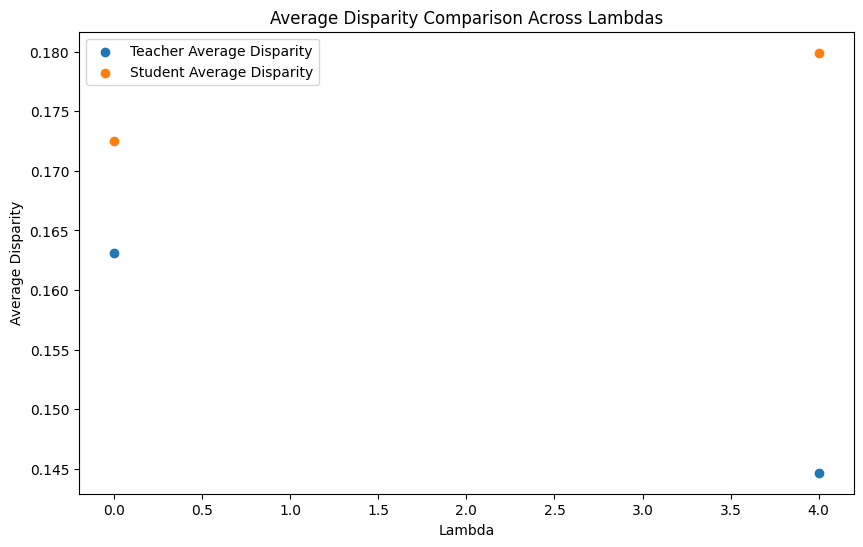

In [75]:
# Initialize lists to store disparity values
teacher_disparities = []
student_disparities = []
lambda_pairs = list(lambda_results.keys())

# Iterate over the keys in lambda_results
for key in lambda_pairs:
    # Check if it's an integer key (indicating a lambda value for student)
    if isinstance(key, int):
        # Check and extract teacher disparity if it exists
        if 'teacher_mean_abs_val_disparity' in lambda_results[key]:
            teacher_disparity = lambda_results[key]['teacher_mean_abs_val_disparity']
            # Take the last value if there are multiple
            teacher_disparity = teacher_disparity[-1] if isinstance(teacher_disparity, list) else teacher_disparity
            teacher_disparities.append((key, teacher_disparity))

        # Extract student disparity
        if 'student_mean_abs_val_disparity' in lambda_results[key]:
            student_disparity = lambda_results[key]['student_mean_abs_val_disparity']
            # Take the last value if there are multiple
            student_disparity = student_disparity[-1] if isinstance(student_disparity, list) else student_disparity
            student_disparities.append((key, student_disparity))

    # Extracting lambda values and disparity values
    teacher_lambdas, teacher_disparity_values = zip(*teacher_disparities) if teacher_disparities else ([], [])
    student_lambdas, student_disparity_values = zip(*student_disparities) if student_disparities else ([], [])

print("Teacher: ", teacher_disparity_values)
print("Student" , student_disparity_values) 


# Creating a scatter plot
plt.figure(figsize=(10, 6))
if teacher_disparities:
    plt.scatter(teacher_lambdas, teacher_disparity_values, label='Teacher Average Disparity', marker='o')
if student_disparities:
    plt.scatter(student_lambdas, student_disparity_values, label='Student Average Disparity', marker='o')

# Adding labels and title
plt.xlabel('Lambda')
plt.ylabel('Average Disparity')
plt.title('Average Disparity Comparison Across Lambdas')
plt.legend()

# Displaying the plot
plt.show()


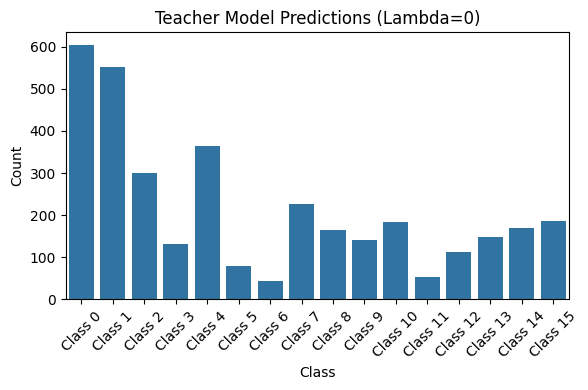

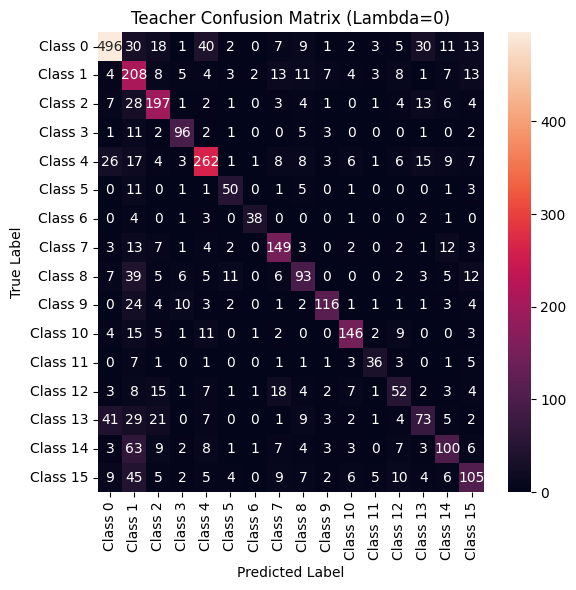

Classification Report - Teacher Model (Lambda=0)
              precision    recall  f1-score   support

     Class 0       0.82      0.74      0.78       668
     Class 1       0.38      0.69      0.49       301
     Class 2       0.65      0.72      0.69       272
     Class 3       0.73      0.77      0.75       124
     Class 4       0.72      0.69      0.71       377
     Class 5       0.63      0.68      0.65        74
     Class 6       0.86      0.76      0.81        50
     Class 7       0.66      0.74      0.70       202
     Class 8       0.56      0.48      0.52       194
     Class 9       0.82      0.67      0.74       173
    Class 10       0.79      0.73      0.76       199
    Class 11       0.67      0.60      0.63        60
    Class 12       0.46      0.40      0.43       129
    Class 13       0.49      0.37      0.42       198
    Class 14       0.59      0.45      0.51       220
    Class 15       0.56      0.47      0.51       224

    accuracy                   

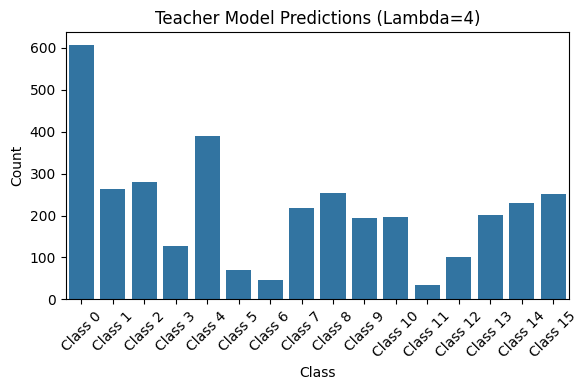

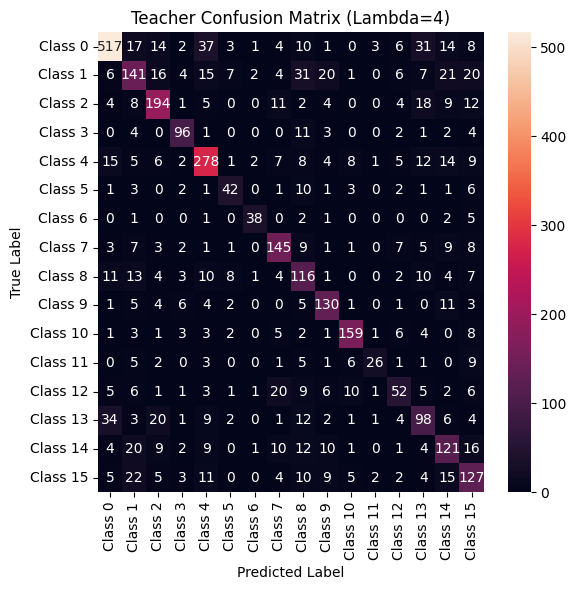

Classification Report - Teacher Model (Lambda=4)
              precision    recall  f1-score   support

     Class 0       0.85      0.77      0.81       668
     Class 1       0.54      0.47      0.50       301
     Class 2       0.70      0.71      0.70       272
     Class 3       0.75      0.77      0.76       124
     Class 4       0.71      0.74      0.72       377
     Class 5       0.61      0.57      0.59        74
     Class 6       0.83      0.76      0.79        50
     Class 7       0.67      0.72      0.69       202
     Class 8       0.46      0.60      0.52       194
     Class 9       0.67      0.75      0.71       173
    Class 10       0.81      0.80      0.81       199
    Class 11       0.74      0.43      0.55        60
    Class 12       0.51      0.40      0.45       129
    Class 13       0.49      0.49      0.49       198
    Class 14       0.52      0.55      0.54       220
    Class 15       0.50      0.57      0.53       224

    accuracy                   

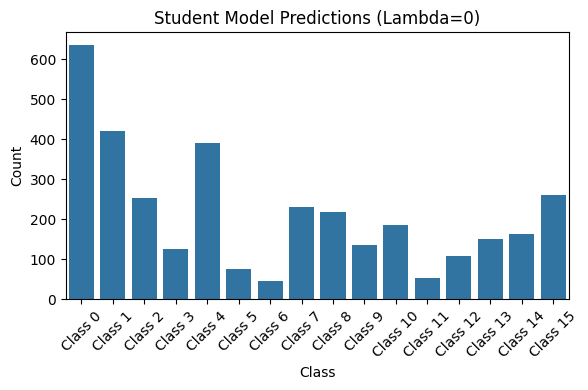

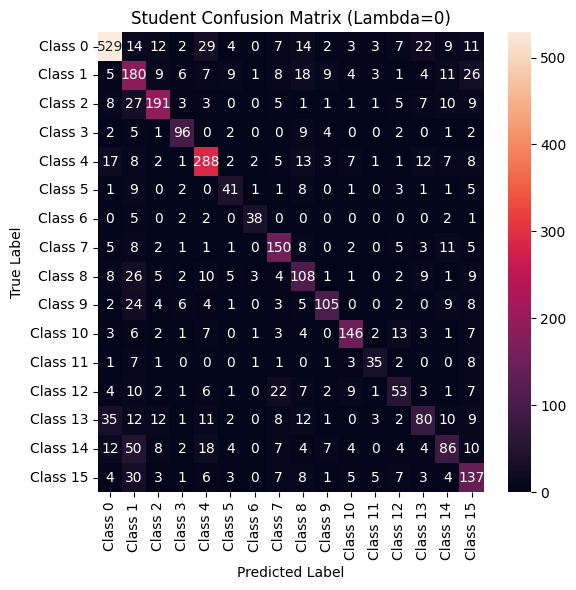

Classification Report - Student Model (Lambda=0)
              precision    recall  f1-score   support

     Class 0       0.83      0.79      0.81       668
     Class 1       0.43      0.60      0.50       301
     Class 2       0.75      0.70      0.73       272
     Class 3       0.76      0.77      0.76       124
     Class 4       0.73      0.76      0.75       377
     Class 5       0.55      0.55      0.55        74
     Class 6       0.81      0.76      0.78        50
     Class 7       0.65      0.74      0.69       202
     Class 8       0.49      0.56      0.52       194
     Class 9       0.77      0.61      0.68       173
    Class 10       0.78      0.73      0.76       199
    Class 11       0.65      0.58      0.61        60
    Class 12       0.49      0.41      0.45       129
    Class 13       0.53      0.40      0.46       198
    Class 14       0.52      0.39      0.45       220
    Class 15       0.52      0.61      0.56       224

    accuracy                   

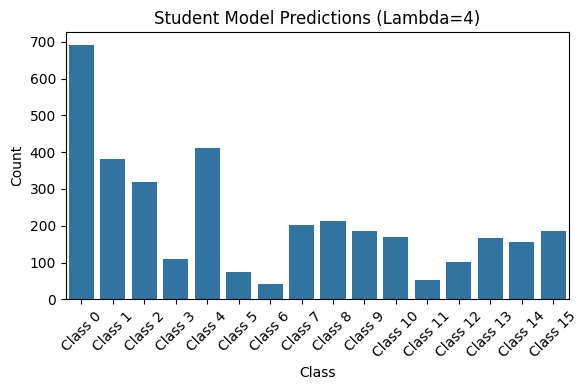

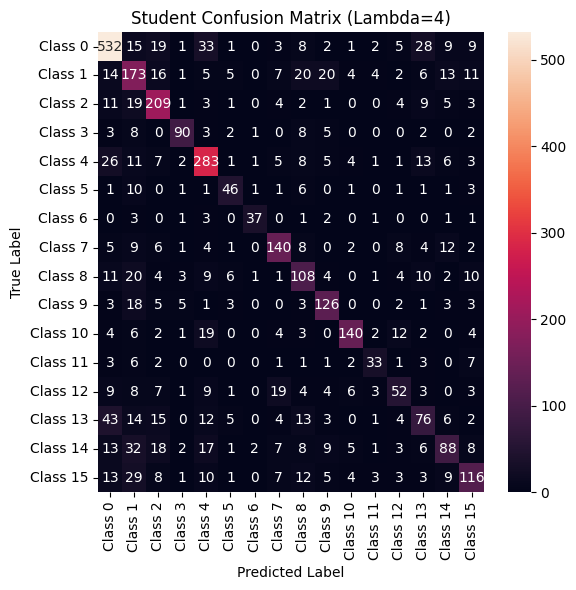

Classification Report - Student Model (Lambda=4)
              precision    recall  f1-score   support

     Class 0       0.77      0.80      0.78       668
     Class 1       0.45      0.57      0.51       301
     Class 2       0.66      0.77      0.71       272
     Class 3       0.81      0.73      0.77       124
     Class 4       0.69      0.75      0.72       377
     Class 5       0.62      0.62      0.62        74
     Class 6       0.86      0.74      0.80        50
     Class 7       0.69      0.69      0.69       202
     Class 8       0.51      0.56      0.53       194
     Class 9       0.67      0.73      0.70       173
    Class 10       0.83      0.70      0.76       199
    Class 11       0.63      0.55      0.59        60
    Class 12       0.51      0.40      0.45       129
    Class 13       0.46      0.38      0.42       198
    Class 14       0.57      0.40      0.47       220
    Class 15       0.62      0.52      0.56       224

    accuracy                   

In [76]:
def plot_distribution(predictions, class_names, title):
    plt.figure(figsize=(6, 4))
    sns.countplot(x=predictions)
    plt.title(title)
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.xticks(range(len(class_names)), class_names, rotation=45)
    plt.tight_layout()
    plt.show()

def plot_confusion_matrix(all_labels, predictions, class_names, title):
    cm = confusion_matrix(all_labels, predictions)
    plt.figure(figsize=(6, 6))
    sns.heatmap(pd.DataFrame(cm, index=class_names, columns=class_names), annot=True, fmt='g')
    plt.title(title)
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.show()

# Function to generate predictions and compute metrics
def generate_predictions_and_metrics(model, dataloader):
    model.eval()
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for batch in dataloader:
            inputs = batch['img'].to(device)
            labels = batch['label'].to(device)
            
            outputs = model(inputs)
            preds = torch.argmax(outputs, dim=1).cpu().numpy()
            
            all_labels.append(labels.cpu().numpy())
            all_preds.append(preds)

    all_labels = np.concatenate(all_labels)
    all_preds = np.concatenate(all_preds)

    return all_labels, all_preds

# Loop over each lambda value for the teacher model
for lmda_teacher in lmda_list_teacher:
    # Load the teacher model from the 'output_dir'
    teacher_model_path = os.path.join(output_dir, f'teacher_model_ctkd_wider_lambda{lmda_teacher}.pth')
    teacher_model = torch.load(teacher_model_path)

    # Generate predictions for the teacher model
    all_labels, all_teacher_preds = generate_predictions_and_metrics(teacher_model, testloader)

    # Plot distribution and confusion matrix for the teacher model
    plot_distribution(all_teacher_preds, class_names_new, f'Teacher Model Predictions (Lambda={lmda_teacher})')
    plot_confusion_matrix(all_labels, all_teacher_preds, class_names_new, f'Teacher Confusion Matrix (Lambda={lmda_teacher})')

    # Print classification report for the teacher model
    teacher_report = classification_report(all_labels, all_teacher_preds, target_names=class_names_new, zero_division=0)
    print(f'Classification Report - Teacher Model (Lambda={lmda_teacher})')
    print(teacher_report)

# Loop over each lambda value for the student model
for lmda_student in lmda_list_student:
    # Load the student model from the 'output_dir'
    student_model_path = os.path.join(output_dir, f'student_model_ctkd_wider_lambda{lmda_student}.pth')
    student_model = torch.load(student_model_path)

    # Generate predictions for the student model
    all_labels, all_student_preds = generate_predictions_and_metrics(student_model, testloader)

    # Plot distribution and confusion matrix for the student model
    plot_distribution(all_student_preds, class_names_new, f'Student Model Predictions (Lambda={lmda_student})')
    plot_confusion_matrix(all_labels, all_student_preds, class_names_new, f'Student Confusion Matrix (Lambda={lmda_student})')

    # Print classification report for the student model
    student_report = classification_report(all_labels, all_student_preds, target_names=class_names_new, zero_division=0)
    print(f'Classification Report - Student Model (Lambda={lmda_student})')
    print(student_report)


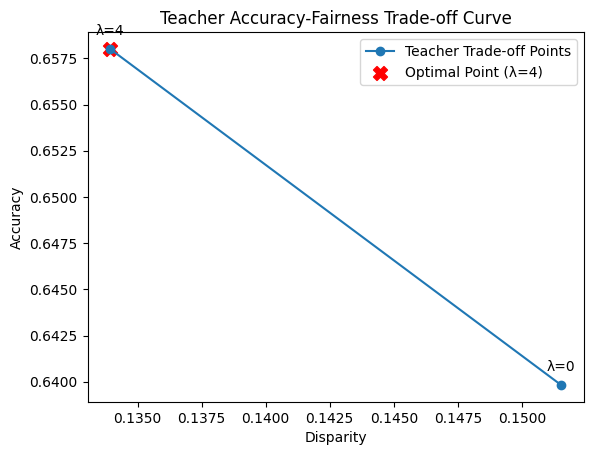

Optimal Lambda for Teacher: 4
Optimal Bias/Disparity for Teacher: 0.13392541005011852
Optimal Accuracy for Teacher: 0.658008658008658
Optimal Weighted Ratio for Teacher: 0.58


ValueError: operands could not be broadcast together with shapes (2,) (2,6) 

In [77]:
def plot_bias_variance_tradeoff(model_results, model_type, lambdas):
    bias_values = []
    accuracy_values = []

    if model_type == 'teacher':
        for lmda in lambdas:
            if lmda in model_results and 'teacher_mean_abs_val_disparity' in model_results[lmda]:
                bias_values.append(model_results[lmda]['teacher_mean_abs_val_disparity'][0])
                performance_key = next((key for key in model_results if isinstance(key, tuple) and key[0] == lmda), None)
                if performance_key:
                    accuracy_values.append(model_results[performance_key]['performance_metrics']['metrics']['accuracy'][0])
        model_name = "Teacher"
    elif model_type == 'student':
        for lmda in lambdas:
            if lmda in model_results and 'student_mean_abs_val_disparity' in model_results[lmda]:
                bias_values.append(model_results[lmda]['student_mean_abs_val_disparity'])
                performance_key = next((key for key in model_results if isinstance(key, tuple) and key[1] == lmda), None)
                if performance_key:
                    accuracy_values.append(model_results[performance_key]['performance_metrics']['metrics']['accuracy'][1])
        model_name = "Student"
    else:
        raise ValueError("Invalid model type. Choose 'teacher' or 'student'.")


    # Weight for the trade-off (can be adjusted based on preference)
    bias_weight = 1

    # Calculate the weighted ratio
    weighted_ratios = np.array(accuracy_values) / (1 + bias_weight * np.array(bias_values))
    closest_to_one_index = np.argmin(np.abs(weighted_ratios - 1))
    optimal_bias = bias_values[closest_to_one_index]
    optimal_accuracy = accuracy_values[closest_to_one_index]
    optimal_ratio = weighted_ratios[closest_to_one_index]

    # Plotting the bias-variance trade-off curve
    plt.plot(bias_values, accuracy_values, marker='o', linestyle='-', label=f'{model_name} Trade-off Points')

    # Mark all points with their lambda values
    for i, (bias, acc, lmbda) in enumerate(zip(bias_values, accuracy_values, lambdas)):
        plt.annotate(f'λ={lmbda}', (bias, acc), textcoords="offset points", xytext=(0,10), ha='center')

    # Highlight the optimal point
    plt.scatter(optimal_bias, optimal_accuracy, color='r', s=100, marker='X', label=f'Optimal Point (λ={lambdas[closest_to_one_index]})')
    plt.xlabel('Disparity')
    plt.ylabel('Accuracy')
    plt.title(f'{model_name} Accuracy-Fairness Trade-off Curve')
    plt.legend()
    plt.show()

    # Print optimal values
    print(f"Optimal Lambda for {model_name}: {lambdas[closest_to_one_index]}")
    print(f"Optimal Bias/Disparity for {model_name}: {optimal_bias}")
    print(f"Optimal Accuracy for {model_name}: {optimal_accuracy}")
    print(f"Optimal Weighted Ratio for {model_name}: {optimal_ratio:.2f}")
    
# Plot for Teacher
plot_bias_variance_tradeoff(lambda_results, 'teacher', lmda_list_teacher)

# Plot for Student
plot_bias_variance_tradeoff(lambda_results, 'student', lmda_list_student)

In [78]:
def compare_performance_metrics_for_demo(teacher, student, dataloader):
    teacher.eval()
    student.eval()

    detailed_info = []

    for batch in dataloader:
        inputs = batch['img'].to(device)
        labels = batch['label'].to(device)
        # Assuming gender or other attributes are part of 'target'
        attributes = batch['target'].to(device)  

        with torch.no_grad():
            teacher_outputs = teacher(inputs)
            student_outputs = student(inputs)

        teacher_preds = torch.argmax(teacher_outputs, dim=1)
        student_preds = torch.argmax(student_outputs, dim=1)

        for i in range(inputs.size(0)):
            if teacher_preds[i] != labels[i] and student_preds[i] == labels[i]:
                info = {
                    'image': inputs[i],
                    'actual_class': labels[i].item(),
                    'teacher_pred_class': teacher_preds[i].item(),
                    'student_pred_class': student_preds[i].item(),
                    'actual_attribute': attributes[i].item(),  # Modify based on your dataset
                    # If your model also predicts attributes, include them here
                }
                detailed_info.append(info)

    return detailed_info

In [79]:
def plot_images_with_class_filter(info_list, display_class, new_label_mapping, rows=10, cols=5):
    # Filter the info list based on the specified class, student correct and teacher incorrect predictions
    filtered_info = [info for info in info_list if info['actual_class'] == display_class and 
                     info['student_pred_class'] == display_class and 
                     info['teacher_pred_class'] != display_class]

    # Calculate the number of images to display based on the length of the filtered list
    num_images = len(filtered_info)
    total_plots = min(rows * cols, num_images)  # Ensure we don't exceed the number of filtered images

    # Determine the number of rows needed based on the number of images
    rows = (num_images + cols - 1) // cols

    # Create a figure with the adjusted number of rows and columns
    fig, axes = plt.subplots(rows, cols, figsize=(15, 3 * rows))
    axes = axes.ravel()

    for i in range(total_plots):
        data = filtered_info[i]
        image = data['image']
        actual_class = new_label_mapping[data['actual_class']]  # Get class name from the mapping
        teacher_pred_class = new_label_mapping[data['teacher_pred_class']]  # Get class name from the mapping
        student_pred_class = new_label_mapping[data['student_pred_class']]  # Get class name from the mapping
        actual_attribute = round(data['actual_attribute'], 3)
    
        # Normalize the image for display
        image_display = image.cpu().numpy().transpose(1, 2, 0)
        image_display = (image_display - image_display.min()) / (image_display.max() - image_display.min())
    
        # Set the title with the class and attribute information
        title = f'Attr: {actual_attribute}\nTrue: {actual_class}\nTeacher: {teacher_pred_class}\nStudent: {student_pred_class}'
    
        axes[i].imshow(image_display)
        axes[i].set_title(title, fontsize=12, pad=4)
        axes[i].axis('off')

    # Turn off any unused axes
    for i in range(total_plots, len(axes)):
        axes[i].axis('off')

    # Adjust layout for clarity
    plt.tight_layout()
    plt.subplots_adjust(wspace=0.5, hspace=0.6)
    plt.show()


############################################################
CLASS 0: Team_Sports
############################################################


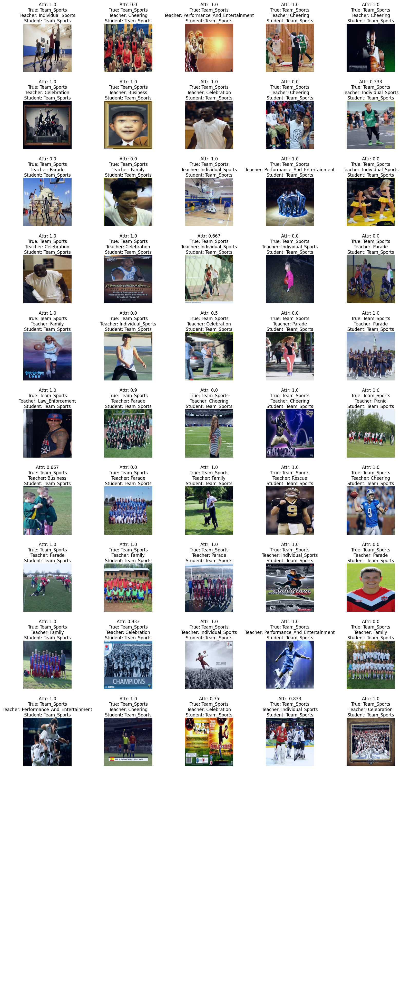

############################################################
CLASS 1: Celebration
############################################################


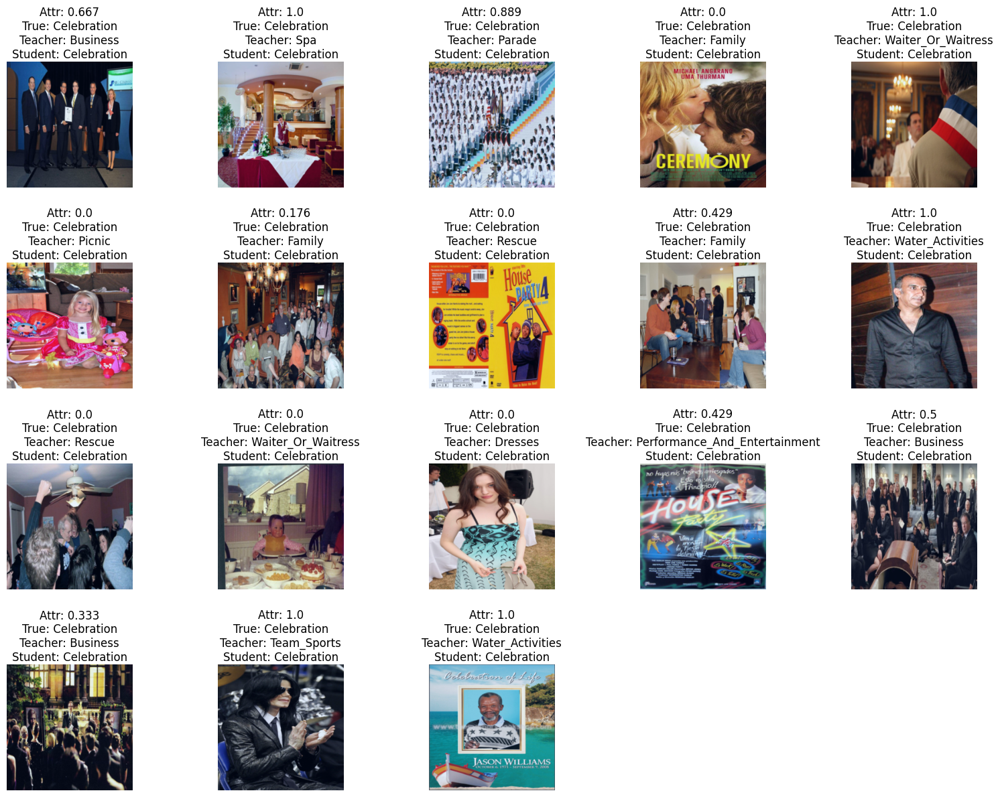

############################################################
CLASS 2: Parade
############################################################


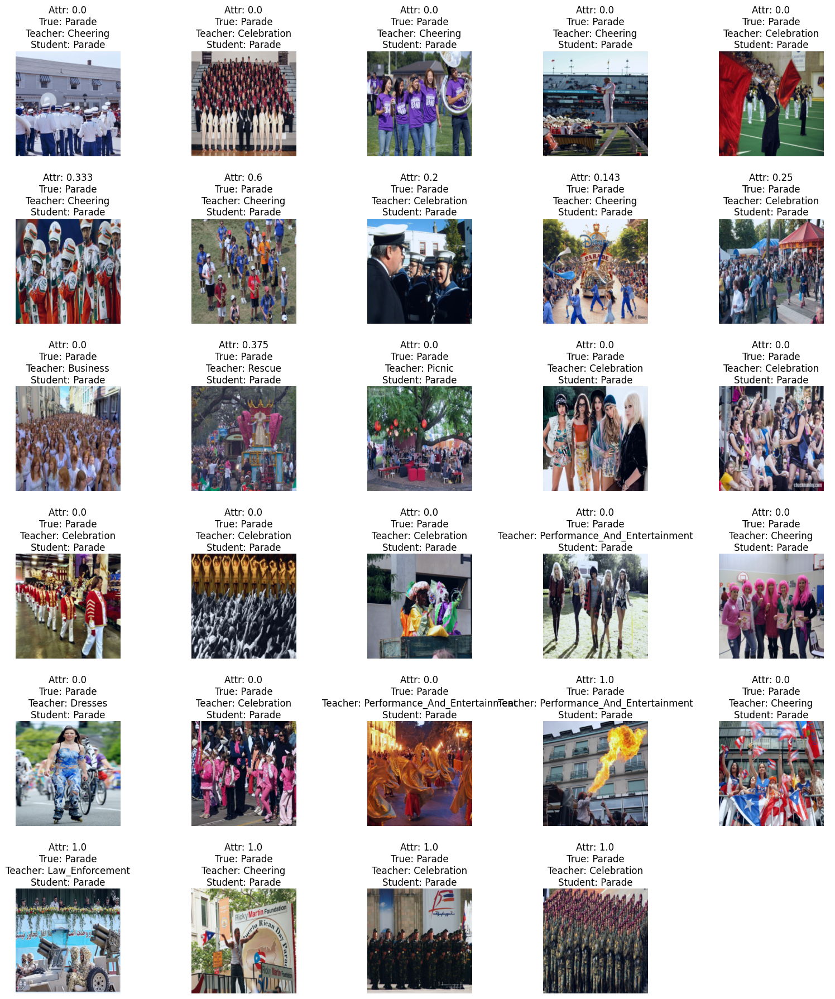

############################################################
CLASS 3: Waiter_Or_Waitress
############################################################


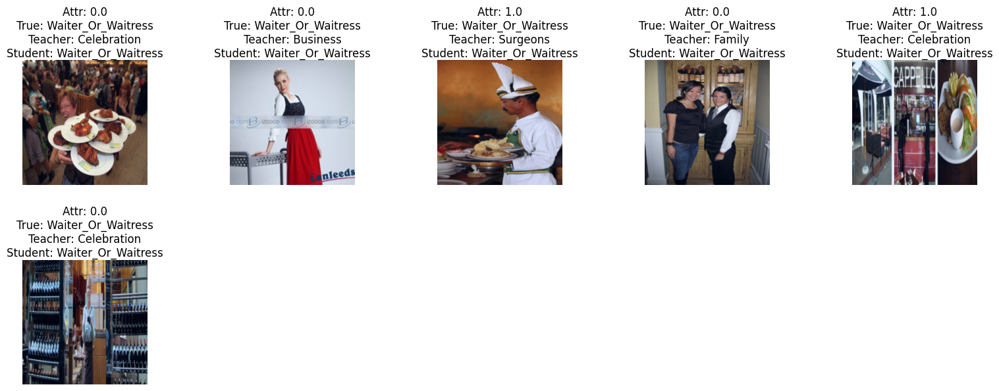

############################################################
CLASS 4: Individual_Sports
############################################################


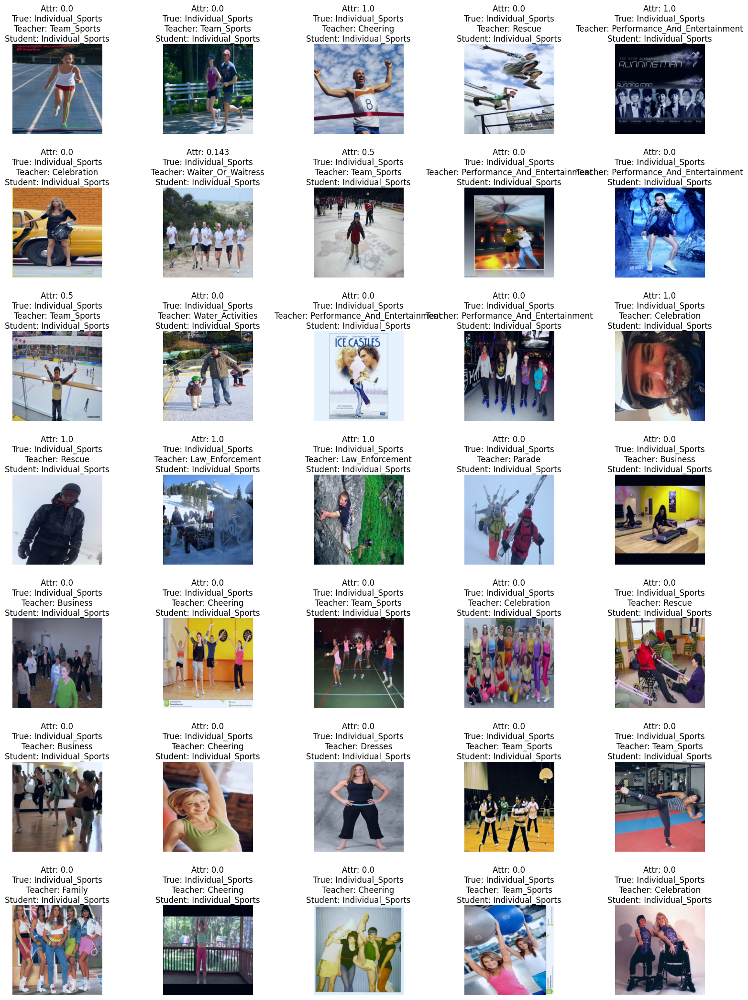

############################################################
CLASS 5: Surgeons
############################################################


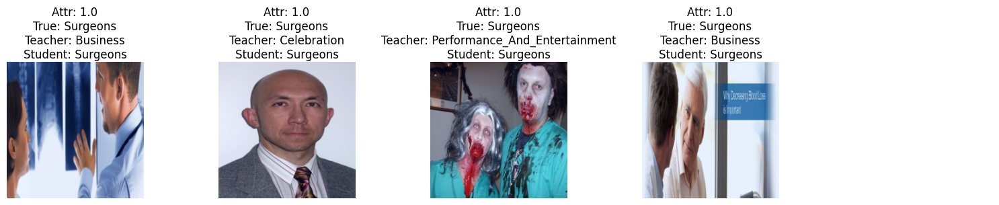

############################################################
CLASS 6: Spa
############################################################


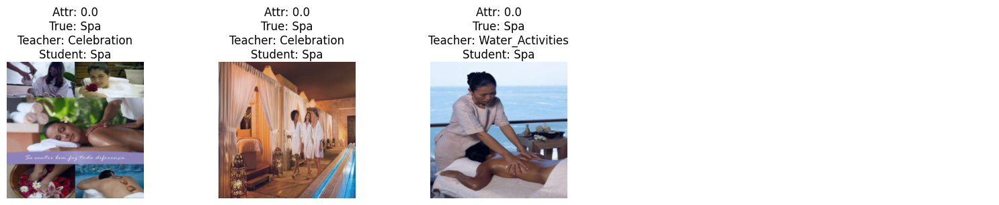

############################################################
CLASS 7: Law_Enforcement
############################################################


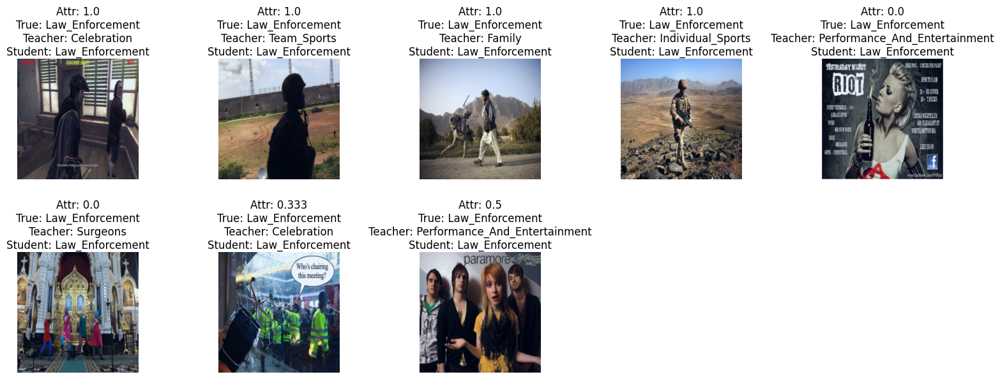

############################################################
CLASS 8: Business
############################################################


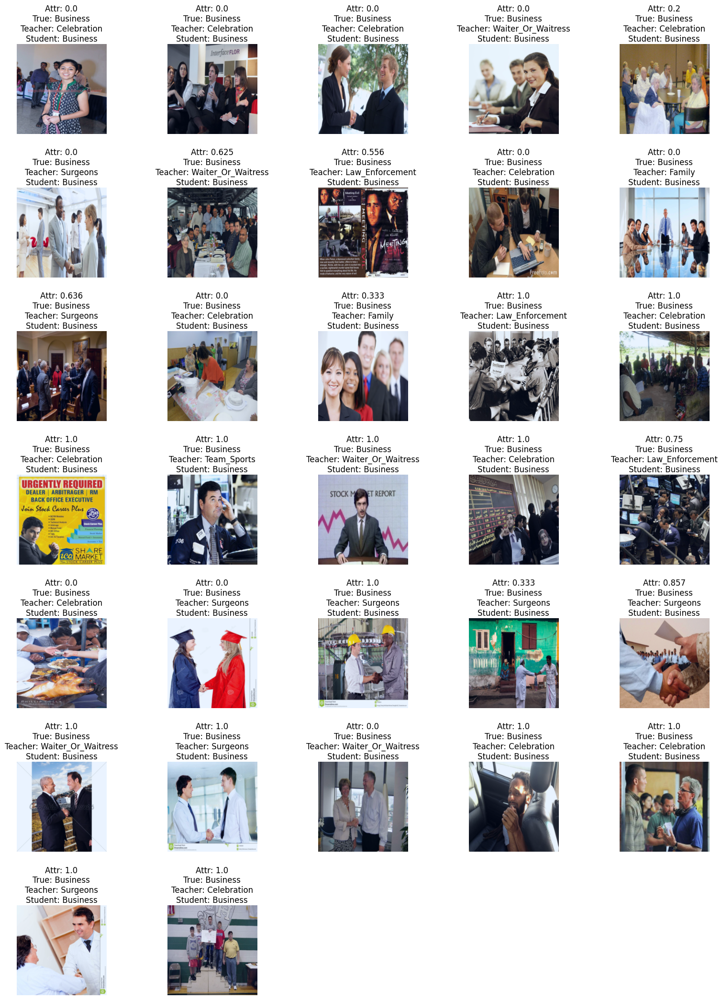

############################################################
CLASS 9: Dresses
############################################################


In [ ]:
teacher_model_path = os.path.join(output_dir, f'teacher_model_ctkd_wider_lambda0.pth')
teacher_model = torch.load(teacher_model_path)
student_model_path = os.path.join(output_dir, f'student_model_ctkd_wider_lambda4.pth')
student_model = torch.load(student_model_path)

# Get detailed info where student is correct and teacher is wrong
detailed_info = compare_performance_metrics_for_demo(teacher_model, student_model, testloader)

for i in range(num_classes):
    # Display images with details
    print('#'*60)
    print(f'CLASS {i}: {new_label_mapping[i]}')
    print('#'*60)
    plot_images_with_class_filter(detailed_info, display_class=i, new_label_mapping=new_label_mapping, rows=10, cols=5)


In [ ]:
def get_disparities_accuracies_student(lmda, dataloader):
    model_path = os.path.join(output_dir,f'student_model_ctkd_wider_lambda{lmda}.pth') 
    model = torch.load(model_path)
    total_samples = 0
    total_correct = 0
    num_batches = 0.0
    confusion_male = 0
    confusion_female = 0
    val_accuracies = []
    val_disparities = []
    with torch.no_grad():
        for val_data in tqdm(testloader):
            val_inputs = val_data['img'].to(device)
            val_labels = val_data['label'].to(device)
            val_targets = val_data['target'].to(device)

            # Forward pass for validation
            val_student_outputs = model(val_inputs)   


            # Compute the validation accuracy
            _, predicted = torch.max(val_student_outputs, 1)
            total_samples += val_labels.size(0)
            total_correct += (predicted == val_labels).sum().item()
            num_batches += 1
            recall_diff = evaluate_model_with_gender_multiclass(predicted, val_labels, val_targets, num_classes=num_classes)
            confusion_male += recall_diff[1]
            confusion_female += recall_diff[2]

        confusion_male  = confusion_male/num_batches
        confusion_female = confusion_female/num_batches

        epoch_disparity = calculate_recall_multiclass(confusion_male) - calculate_recall_multiclass(confusion_female)
        non_zero_abs_values = np.abs(epoch_disparity[epoch_disparity != 0])
        mean_non_zero_abs_disparity = np.mean(non_zero_abs_values)
        val_disparities.append(mean_non_zero_abs_disparity)
        accuracy = total_correct / total_samples
        val_accuracies.append(accuracy)
        print(f'Lambda: {lmda}'
        f'*****Validation Accuracy: {accuracy * 100:.2f}%*****\n'
        f'*****Total Avg Disparity: {mean_non_zero_abs_disparity}*****\n')
        class_recall_mapping = {class_name: epoch_disparity[int(class_label)] for class_label, class_name in class_idx.items()}

        # Print disparities by class label
        for class_label, recall_diff in class_recall_mapping.items():
            print(f"Class {class_label}: Recall Difference = {recall_diff}")

In [ ]:
for i in lmda_list_student:
    get_disparities_accuracies_student(i, testloader)

In [ ]:
def get_disparities_accuracies_teacher(lmda, dataloader):
    model_path = os.path.join(output_dir,f'teacher_model_ctkd_wider_lambda{lmda}.pth') 
    model = torch.load(model_path)
    total_samples = 0
    total_correct = 0
    num_batches = 0.0
    confusion_male = 0
    confusion_female = 0
    val_accuracies = []
    val_disparities = []
    with torch.no_grad():
        for val_data in tqdm(testloader):
            val_inputs = val_data['img'].to(device)
            val_labels = val_data['label'].to(device)
            val_targets = val_data['target'].to(device)

            # Forward pass for validation
            val_student_outputs = model(val_inputs)   


            # Compute the validation accuracy
            _, predicted = torch.max(val_student_outputs, 1)
            total_samples += val_labels.size(0)
            total_correct += (predicted == val_labels).sum().item()
            num_batches += 1
            recall_diff = evaluate_model_with_gender_multiclass(predicted, val_labels, val_targets, num_classes=num_classes)
            confusion_male += recall_diff[1]
            confusion_female += recall_diff[2]

        confusion_male  = confusion_male/num_batches
        confusion_female = confusion_female/num_batches

        epoch_disparity = calculate_recall_multiclass(confusion_male) - calculate_recall_multiclass(confusion_female)
        non_zero_abs_values = np.abs(epoch_disparity[epoch_disparity != 0])
        mean_non_zero_abs_disparity = np.mean(non_zero_abs_values)
        val_disparities.append(mean_non_zero_abs_disparity)
        accuracy = total_correct / total_samples
        val_accuracies.append(accuracy)
        print(f'Lambda: {lmda}'
        f'*****Validation Accuracy: {accuracy * 100:.2f}%*****\n'
        f'*****Total Avg Disparity: {mean_non_zero_abs_disparity}*****\n')
        class_recall_mapping = {class_name: epoch_disparity[int(class_label)] for class_label, class_name in class_idx.items()}

        # Print disparities by class label
        for class_label, recall_diff in class_recall_mapping.items():
            print(f"Class {class_label}: Recall Difference = {recall_diff}")

In [ ]:
get_disparities_accuracies_teacher(0, testloader)

In [ ]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c']

# Data for plotting
labels = ['Teacher (λ=0)', 'Student (λ=0)', 'Student (λ=8)']
waiter_or_waitress_values = [-0.0925, -0.1082, 0.0046]
individual_sports_values = [-0.1208, -0.1345, -0.0794]

# Number of bars
n_bars = len(labels)

# Plotting
plt.figure(figsize=(10, 6))
bar_width = 0.35  # Width of the bars

# Positions of the bars on the x-axis
r1 = range(n_bars)
r2 = [x + bar_width for x in r1]

# Creating the bars with improved colors
plt.bar(r1, waiter_or_waitress_values, color=colors[0], width=bar_width, edgecolor='grey', label='Waiter Or Waitress')
plt.bar(r2, individual_sports_values, color=colors[1], width=bar_width, edgecolor='grey', label='Individual Sports')

# Adding data labels
for i in range(n_bars):
    plt.text(r1[i] - bar_width/8, waiter_or_waitress_values[i], f'{waiter_or_waitress_values[i]:.4f}', ha='center', va='bottom')
    plt.text(r2[i] - bar_width/8, individual_sports_values[i], f'{individual_sports_values[i]:.4f}', ha='center', va='bottom')

# General layout
plt.ylabel('Disparity Values')
plt.title('Disparity')
plt.xticks([r + bar_width/2 for r in range(n_bars)], labels)
plt.legend()

# Show plot
plt.show()
